# LATAR BELAKANG

New York City memiliki sistem transportasi publik yang kompleks dan dinamis. Salah satu layanan vitalnya adalah taksi berlisensi yang dikendalikan oleh NYC Taxi and Limousine Commission (TLC). Analisis data perjalanan taksi sangat penting untuk memahami pola mobilitas, kebutuhan layanan, dan potensi optimalisasi armada. Data dari Januari 2023 ini mencerminkan tren harian dan zonasi yang dapat digunakan oleh pemangku kepentingan seperti operator taksi, pemerintah kota, dan investor teknologi transportasi untuk mengambil keputusan berbasis data.

# RUMUSAN MASALAH

- Kapan waktu penjemputan penumpang paling tinggi dan rendah selama periode analisis?
- Bagaimana pola distribusi perjalanan berdasarkan hari dan jam?
- Zona mana saja yang paling sibuk berdasarkan frekuensi penjemputan dan pendapatan rata-rata?
- Bagaimana perbedaan karakteristik perjalanan antara weekday dan weekend?
- Bagaimana performa tiap borough dalam hal frekuensi dan pendapatan?

# BATASAN PERIODE ANALISIS

Bulan Januari 2023

# DATA CLEANING

## Inisiasi Pengenalan Struktur Data

In [152]:
# import library yang dibutuhkan
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import missingno as msno
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 400)

import matplotlib.pyplot as plt
import missingno as msno
from matplotlib import font_manager

from matplotlib import rcParams
rcParams['font.family'] = 'Poppins' 

In [153]:
df = pd.read_csv('03. NYC TLC Trip Record.csv')

display(df.head(), df.tail(), df.sample(5))

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.9,1.0,0.5,4.03,0.0,NaN,1.0,24.18,1.0,1.0,2.75
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.7,1.0,0.5,2.64,0.0,NaN,1.0,15.84,1.0,1.0,0.00
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.2,1.0,0.5,1.94,0.0,NaN,1.0,11.64,1.0,1.0,0.00
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.5,0.5,1.5,1.70,0.0,NaN,1.0,10.20,1.0,1.0,0.00
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.0,0.5,1.5,0.00,0.0,NaN,1.0,8.00,1.0,1.0,0.00


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
68206,2,2023-01-31 22:29:00,2023-01-31 22:42:00,NaN,NaN,49,62,NaN,4070.82,15.70,0.0,0.0,0.00,0.0,NaN,1.0,16.70,NaN,NaN,NaN
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,NaN,NaN,10,205,NaN,2.14,4.41,0.0,0.0,0.00,0.0,NaN,1.0,5.41,NaN,NaN,NaN
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,NaN,NaN,66,37,NaN,3.44,16.53,0.0,0.0,3.51,0.0,NaN,1.0,21.04,NaN,NaN,NaN
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,NaN,NaN,225,189,NaN,3.03,14.98,0.0,0.0,3.20,0.0,NaN,1.0,19.18,NaN,NaN,NaN
68210,2,2023-01-31 23:51:00,2023-02-01 00:07:00,NaN,NaN,256,140,NaN,5.82,23.65,0.0,0.0,2.00,0.0,NaN,1.0,29.40,NaN,NaN,NaN


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
12357,2,2023-01-07 13:07:26,2023-01-07 13:17:47,N,1.0,43,43,1.0,1.94,12.1,0.0,0.5,3.27,0.0,NaN,1.0,19.62,1.0,1.0,2.75
60118,1,2023-01-30 10:53:14,2023-01-30 10:56:54,N,1.0,74,74,1.0,0.50,5.1,0.0,1.5,0.00,0.0,NaN,1.0,6.60,2.0,1.0,0.00
56471,2,2023-01-28 09:54:43,2023-01-28 10:02:19,N,1.0,75,238,1.0,1.56,10.0,0.0,0.5,0.00,0.0,NaN,1.0,14.25,2.0,1.0,2.75
1600,2,2023-01-02 11:31:14,2023-01-02 11:39:30,N,1.0,74,236,1.0,2.06,12.1,0.0,0.5,3.27,0.0,NaN,1.0,19.62,1.0,1.0,2.75
41589,2,2023-01-21 15:57:08,2023-01-21 16:04:11,N,1.0,75,239,1.0,1.69,10.0,0.0,0.5,2.71,0.0,NaN,0.3,16.26,1.0,1.0,2.75


NYC TLC Trip Record Column Descriptions
Ada 20 kolom di dalam dataset "New York City TLC Trip Record"  sebagai berikut.

| **Fitur**                 | **Deskripsi**                                                                                                     | **Catatan**                                                                               |
|---------------------------|--------------------------------------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------------------|
| **VendorID**              | Kode penyedia LPEP                                                                                                | 1 = Creative Mobile, 2 = VeriFone                                                               |
| **lpep_pickup_datetime**  | Tanggal dan waktu penjemputan                                                                                     | -                                                                                               |
| **lpep_dropoff_datetime** | Tanggal dan waktu pengantaran                                                                                     | -                                                                                               |
| **Passenger_count**       | Jumlah penumpang dalam kendaraan                                                                                  | -                                                                         |
| **Trip_distance**         | Jarak perjalanan dalam mil                                                                                        | -                                                                        |
| **PULocationID**          | ID zona lokasi penjemputan                                                                                        | Zona Taksi TLC                                                                                  |
| **DOLocationID**          | ID zona lokasi pengantaran                                                                                        | Zona Taksi TLC                                                                                  |
| **RateCodeID**            | Kode tarif yang berlaku pada akhir perjalanan                                                                     | 1 = Tarif standar, 2 = JFK, 3 = Newark, 4 = Nassau/Westchester, 5 = Tarif negosiasi, 6 = Grup  |
| **Store_and_fwd_flag**    | Menunjukkan apakah catatan perjalanan disimpan di memori kendaraan                                | Y = Disimpan, N = Tidak disimpan                                                 |
| **Payment_type**          | Kode metode pembayaran                                                                                            | 1 = Kartu kredit, 2 = Tunai, 3 = Tidak dikenakan biaya, 4 = Perselisihan, 5 = Tidak diketahui, 6 = Dibatalkan |
| **Fare_amount**           | Tarif berdasarkan waktu dan jarak                                                                                | -                                                                       |
| **Extra**                 | Biaya tambahan (biaya jam sibuk, biaya malam)                                                                     | -                                                                                               |
| **MTA_tax**               | Pajak MTA sebesar $0,50                                                                                           | -                                                   |
| **Improvement_surcharge** | Biaya tambahan perbaikan sebesar $0,30                                                                           | -                                                |
| **Tip_amount**            | Jumlah tip untuk pembayaran kartu kredit (tidak termasuk tip tunai)                                               | -                                                                                               |
| **Tolls_amount**          | Total tol yang dibayar selama perjalanan                                                                         | -                                                                                               |
| **Total_amount**          | Jumlah total yang dibebankan kepada penumpang (tidak termasuk tip tunai)                                         | -                                                                                               |
| **Trip_type**             | Menunjukkan metode perjalanan (langsung di jalan atau dispatch)                                                  | 1 = Langsung (street-hail), 2 = Dispatch                                                        |
| **ehail_fee**             | Biaya tambahan untuk pemesanan melalui aplikasi elektronik                                                   | -
| **congestion_surcharge**             | Biaya tambahan kemacetan yang dikenakan pada perjalanan di wilayah padat                                              | -


In [154]:
display(df.info(), df.sample(5))

print(f'This dataset has {df.shape[0]} rows and {df.shape[1]} columns')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68211 entries, 0 to 68210
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   VendorID               68211 non-null  int64  
 1   lpep_pickup_datetime   68211 non-null  object 
 2   lpep_dropoff_datetime  68211 non-null  object 
 3   store_and_fwd_flag     63887 non-null  object 
 4   RatecodeID             63887 non-null  float64
 5   PULocationID           68211 non-null  int64  
 6   DOLocationID           68211 non-null  int64  
 7   passenger_count        63887 non-null  float64
 8   trip_distance          68211 non-null  float64
 9   fare_amount            68211 non-null  float64
 10  extra                  68211 non-null  float64
 11  mta_tax                68211 non-null  float64
 12  tip_amount             68211 non-null  float64
 13  tolls_amount           68211 non-null  float64
 14  ehail_fee              0 non-null      float64
 15  im

None

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
19145,2,2023-01-10 19:45:17,2023-01-10 19:53:46,N,1.0,244,238,1.0,4.41,19.1,2.5,0.5,5.17,0.0,NaN,1.0,31.02,1.0,1.0,2.75
23568,2,2023-01-12 18:03:36,2023-01-12 18:19:45,N,1.0,260,138,2.0,3.95,19.8,7.5,0.5,4.32,0.0,NaN,1.0,33.12,1.0,1.0,0.00
52674,2,2023-01-26 16:18:13,2023-01-26 16:26:14,N,1.0,43,24,1.0,1.83,10.7,2.5,0.5,2.94,0.0,NaN,1.0,17.64,1.0,1.0,0.00
24787,2,2023-01-13 11:31:41,2023-01-13 11:35:22,N,1.0,43,43,1.0,1.09,7.2,0.0,0.5,1.74,0.0,NaN,1.0,10.44,1.0,1.0,0.00
43606,2,2023-01-22 16:35:40,2023-01-22 16:41:23,N,1.0,33,97,1.0,1.20,7.9,0.0,0.5,0.94,0.0,NaN,1.0,10.34,1.0,1.0,0.00


This dataset has 68211 rows and 20 columns


### Penyesuaian Struktur Data Type

In [155]:
# Kolom yang dikonversi ke tipe kategori
category_cols = [
    'VendorID', 'store_and_fwd_flag', 'RatecodeID',
    'PULocationID', 'DOLocationID', 'payment_type', 'trip_type'
]
df[category_cols] = df[category_cols].astype('category')

# Kolom yang dikonversi ke tipe datetime
datetime_cols = ['lpep_pickup_datetime', 'lpep_dropoff_datetime']
df[datetime_cols] = df[datetime_cols].apply(pd.to_datetime)


In [156]:
# tampilkan deskriptif statistik numeric
display(df.describe(include='number'), df.describe(include=['object', 'category']), df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68211 entries, 0 to 68210
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   VendorID               68211 non-null  category      
 1   lpep_pickup_datetime   68211 non-null  datetime64[ns]
 2   lpep_dropoff_datetime  68211 non-null  datetime64[ns]
 3   store_and_fwd_flag     63887 non-null  category      
 4   RatecodeID             63887 non-null  category      
 5   PULocationID           68211 non-null  category      
 6   DOLocationID           68211 non-null  category      
 7   passenger_count        63887 non-null  float64       
 8   trip_distance          68211 non-null  float64       
 9   fare_amount            68211 non-null  float64       
 10  extra                  68211 non-null  float64       
 11  mta_tax                68211 non-null  float64       
 12  tip_amount             68211 non-null  float64       
 13  t

,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,congestion_surcharge
count,63887.000000,68211.000000,68211.000000,68211.000000,68211.000000,68211.000000,68211.000000,0.0,68211.000000,68211.000000,63887.000000
mean,1.315870,8.114852,16.603545,0.825431,0.588340,2.139012,0.169627,NaN,0.951625,21.789377,0.726748
std,0.979054,585.105955,13.470121,1.269904,0.385819,3.052710,1.099789,NaN,0.196875,15.457115,1.212836
min,0.000000,0.000000,-70.000000,-2.500000,-0.500000,-10.500000,0.000000,NaN,-1.000000,-71.500000,-2.750000
25%,1.000000,1.110000,9.300000,0.000000,0.500000,0.000000,0.000000,NaN,1.000000,12.900000,0.000000
50%,1.000000,1.850000,13.500000,0.000000,0.500000,1.600000,0.000000,NaN,1.000000,17.900000,0.000000
75%,1.000000,3.210000,19.800000,1.000000,0.500000,3.330000,0.000000,NaN,1.000000,26.150000,2.750000
max,9.000000,120098.840000,490.000000,12.500000,2.750000,222.220000,36.050000,NaN,1.000000,491.000000,2.750000


,VendorID,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,payment_type,trip_type
count,68211,63887,63887.0,68211,68211,63887.0,63877.0
unique,2,2,6.0,226,249,5.0,2.0
top,2,N,1.0,74,75,1.0,1.0
freq,58868,63579,62103.0,13257,3524,40686.0,62476.0


None

## Eksplorasi Data Awal (Anomali, Missing Value, Negative Value)

In [157]:
columns_of_interest = ['VendorID', 'store_and_fwd_flag', 'RatecodeID', 'payment_type', 'trip_type']

unique_col = pd.DataFrame({
    'Column Name': columns_of_interest,
    'Number of Unique': [df[col].nunique() for col in columns_of_interest],
    'Unique Value': [df[col].unique() for col in columns_of_interest]
})

unique_col


,Column Name,Number of Unique,Unique Value
0,VendorID,2,"[2, 1] Categories (2, int64): [1, 2]"
1,store_and_fwd_flag,2,"['N', 'Y', NaN] Categories (2, object): ['N', ..."
2,RatecodeID,6,"[1.0, 5.0, 4.0, 3.0, 2.0, 99.0, NaN] Categorie..."
3,payment_type,5,"[1.0, 2.0, 3.0, 4.0, 5.0, NaN] Categories (5, ..."
4,trip_type,2,"[1.0, 2.0, NaN] Categories (2, float64): [1.0,..."


Selama eksplorasi data awal, ditemukan beberapa anomali, missing value, dan nilai yang tidak masuk akal:

- **Negative Value:** Beberapa kolom mengandung value negatif yang tidak diharapkan berdasarkan konteks data. Setelah diteliti lebih lanjut, value negatif ini kemungkinan besar disebabkan oleh kesalahan input dan seharusnya bervalue positif.

- **Missing Value:** Terdapat juga beberapa missing value dalam dataset, yang perlu ditangani pada proses pembersihan data agar analisis dapat dilakukan dengan lebih akurat.

- **Anomaly dan Nilai Tidak Masuk Akal:** Beberapa kolom seperti `fare_amount`, `tip_amount`, `improvement_surcharge`, dan `total_amount` memiliki nilai yang tidak masuk akal (contohnya nilai negatif atau nilai yang sangat ekstrem seperti jarak perjalanan 120,098.84 mil). Anomali ini menunjukkan adanya kemungkinan kesalahan pencatatan data yang perlu diperbaiki.

Masalah ini akan diperbaiki pada tahap pembersihan data sebelum melanjutkan ke analisis lebih lanjut.

In [158]:
import matplotlib as mpl
mpl.rcParams['font.family'] = 'DejaVu Sans'  # atau Arial, atau sans-serif


### Cek Missing Value & Duplicate

<Figure size 800x600 with 0 Axes>

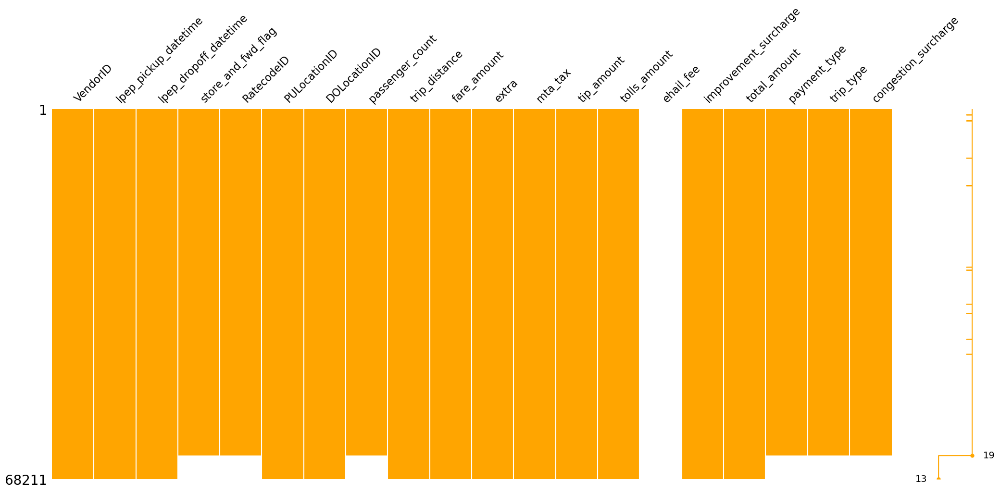

In [159]:
#Cek missing value dan duplicate
plt.figure(figsize=(8, 6))  # Ukuran gambar
msno.matrix(df, sparkline=True, color=(1.0, 0.65, 0.0))  # garis sparkline
plt.show()

In [160]:
duplicates_count = df.duplicated().sum()

# Jumlah total missing value per kolom
total_missing = df.isna().sum()

# Persentase missing value per kolom
missing_percentage = (df.isna().mean().round(4) * 100).astype(str) + '%'

# Menggabungkan semua informasi missing value
info_df = pd.DataFrame({
    'Column': df.columns,
    'Missing Percentage (%)': missing_percentage,
    'Total Missing Values': total_missing
}).reset_index(drop=True)

display(info_df)
print(f'This dataset has {duplicates_count} duplicates')

,Column,Missing Percentage (%),Total Missing Values
0,VendorID,0.0%,0
1,lpep_pickup_datetime,0.0%,0
2,lpep_dropoff_datetime,0.0%,0
3,store_and_fwd_flag,6.34%,4324
4,RatecodeID,6.34%,4324
5,PULocationID,0.0%,0
6,DOLocationID,0.0%,0
7,passenger_count,6.34%,4324
8,trip_distance,0.0%,0
9,fare_amount,0.0%,0


This dataset has 0 duplicates


Dari hasil analisis missing values, dapat disimpulkan bahwa dataset ini memiliki beberapa kolom yang mengandung missing values dengan tingkat yang bervariasi. Beberapa poin penting yang perlu diperhatikan adalah:

1. **Kolom dengan Missing Values Tertinggi:**
   - Kolom `ehail_fee` memiliki 100% missing values (semua data hilang). Ini mungkin disebabkan oleh kolom ini yang tidak relevan dalam konteks penggunaan dataset ini atau data yang tidak pernah terisi. Data set ini akan dirop karena sudah tidak relevan untuk dianalisa lebih lanjut
   
2. **Kolom dengan Missing Values (6.34%-6.35%):**
   - Kolom seperti `store_and_fwd_flag`, `RatecodeID`, `passenger_count`, `payment_type`, `trip_type`, dan `congestion_surcharge` memiliki missing values 6.34%, missing value ini akan saya drop karena tidak dapat diisi salah satu dan apabila dilakukan pengisian data akan kurang merepresentasikan data missing tersebut.

3. **Kolom Lain:**
   - Kolom lain seperti `PULocationID`, `DOLocationID`, `trip_distance`, `fare_amount`, dan beberapa lainnya tidak memiliki missing values sama sekali.

4. **Tidak Ada Data Duplikat:**
   - Berdasarkan hasil analisis, dataset ini tidak memiliki data duplikat, sehingga tidak perlu melakukan proses penghapusan data duplikat.

### Missing Value Data Handling

In [161]:
# hapus semua kolom 'ehail_fee'
df.drop('ehail_fee', axis=1, inplace=True)

### Validasi Kolom Total_Amount

In [162]:
# Daftar kolom yang digunakan untuk validasi total_amount
cols_to_sum = [
    'fare_amount', 'extra', 'mta_tax', 'tip_amount',
    'tolls_amount', 'improvement_surcharge', 'congestion_surcharge'
]

# Hitung jumlah dan simpan ke kolom baru
df['total_amount_validation'] = df[cols_to_sum].sum(axis=1).round(2)

# Tampilkan sampel
df.sample(5)


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,total_amount_validation
62477,1,2023-01-31 12:26:54,2023-01-31 12:42:41,N,1.0,49,106,1.0,2.10,11.5,0.0,1.5,0.00,0.00,1.0,13.00,2.0,1.0,0.00,14.00
29629,2,2023-01-15 17:51:02,2023-01-15 18:09:38,N,1.0,7,41,1.0,4.68,24.7,0.0,0.5,0.00,6.55,1.0,32.75,2.0,1.0,0.00,32.75
28152,2,2023-01-14 20:41:47,2023-01-14 20:44:19,N,1.0,134,134,5.0,0.69,5.8,1.0,0.5,0.00,0.00,1.0,8.30,1.0,1.0,0.00,8.30
60957,2,2023-01-30 16:11:30,2023-01-30 16:54:29,N,1.0,75,217,5.0,9.14,47.1,2.5,0.5,2.00,0.00,1.0,55.85,1.0,1.0,2.75,55.85
9185,2,2023-01-05 22:35:32,2023-01-05 22:38:15,N,1.0,7,179,1.0,0.42,4.4,1.0,0.5,0.69,0.00,1.0,7.59,1.0,1.0,0.00,7.59


In [163]:
# hapus seluruh baris yang mengandung missing value
df.dropna(inplace=True)

In [164]:
# cek apakah masih terdapat missing value
df.isna().sum()

VendorID                   0
lpep_pickup_datetime       0
lpep_dropoff_datetime      0
store_and_fwd_flag         0
RatecodeID                 0
PULocationID               0
DOLocationID               0
passenger_count            0
trip_distance              0
fare_amount                0
extra                      0
mta_tax                    0
tip_amount                 0
tolls_amount               0
improvement_surcharge      0
total_amount               0
payment_type               0
trip_type                  0
congestion_surcharge       0
total_amount_validation    0
dtype: int64

### Negative Data Value Handling

In [165]:
df.describe(include='number')

,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,total_amount_validation
count,63877.000000,63877.000000,63877.000000,63877.000000,63877.000000,63877.000000,63877.000000,63877.000000,63877.000000,63877.000000,63877.000000
mean,1.315920,2.576974,16.074491,0.880473,0.626951,2.041507,0.144182,0.949187,21.200955,0.726862,21.443654
std,0.979123,6.760261,13.277144,1.292861,0.366919,2.998734,1.012740,0.201782,15.131310,1.212897,15.180883
min,0.000000,0.000000,-70.000000,-2.500000,-0.500000,-10.500000,0.000000,-1.000000,-71.500000,-2.750000,-71.500000
25%,1.000000,1.100000,9.000000,0.000000,0.500000,0.000000,0.000000,1.000000,12.600000,0.000000,12.850000
50%,1.000000,1.800000,12.800000,0.000000,0.500000,1.400000,0.000000,1.000000,17.500000,0.000000,17.700000
75%,1.000000,3.050000,19.100000,1.000000,0.500000,3.220000,0.000000,1.000000,25.500000,2.750000,25.860000
max,9.000000,1571.970000,490.000000,12.500000,2.750000,222.220000,36.050000,1.000000,491.000000,2.750000,491.000000


In [166]:
# Daftar kolom yang tidak boleh bernilai negatif
non_negative_cols = [
    'fare_amount', 'extra', 'mta_tax', 'tip_amount',
    'tolls_amount', 'improvement_surcharge', 'congestion_surcharge'
]

# Filter baris yang semua kolom tersebut bernilai >= 0
df = df[(df[non_negative_cols] >= 0).all(axis=1)]

# Berapa banyak baris yang dibuang
before = len(df)
df = df[(df[non_negative_cols] >= 0).all(axis=1)]
after = len(df)
print(f"Baris yang dibuang karena nilai negatif: {before - after}")


Baris yang dibuang karena nilai negatif: 0


### Anomali Data Handling

#### Trip_distance <0

In [167]:
# cek presentase kolom trip_distance yang bernilai 0
pct_zero = df[df['trip_distance'] == 0].shape[0] / df.shape[0]
print(f'{pct_zero:.2%} of rows have 0 trip_distance')

4.91% of rows have 0 trip_distance


In [168]:
# hapus trip_distance kurang dari nol
df.drop(df[df['trip_distance'] <= 0].index, inplace=True)


#### Fare_amount less than 3 dollar

[Reference: NYC Taxi Fare Info](https://www.nyc.gov/site/tlc/passengers/taxi-fare.page)


In [169]:
df = df[df['fare_amount'] > 3]

#### Total_amount less than 3 dollar

In [170]:
df = df[df['total_amount'] > 3]

#### Total_amount Validation (Comparing Total_amount column with Total_amount_validation)

In [171]:
# Cek baris dengan perbedaan antara total_amount dan total_amount_validation
mismatch = df['total_amount'] != df['total_amount_validation']
percent_mismatch = (mismatch.sum() / len(df)) * 100

# Tampilkan hasil
print(f"{percent_mismatch:.2f}% of rows have different total_amount and total_amount_validation")

# Posisi Data
df[df['total_amount'] != df['total_amount_validation']].shape

df[df['total_amount'] != df['total_amount_validation']].sample(5)

12.55% of rows have different total_amount and total_amount_validation


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,total_amount_validation
55268,1,2023-01-27 17:32:29,2023-01-27 17:34:03,N,1.0,75,75,1.0,0.4,4.4,2.50,1.5,0.00,0.0,1.0,8.4,2.0,1.0,0.00,9.40
44550,1,2023-01-23 08:15:05,2023-01-23 08:33:57,N,1.0,210,210,1.0,1.2,13.0,0.00,1.5,0.00,0.0,1.0,14.5,2.0,1.0,0.00,15.50
28836,1,2023-01-15 10:19:39,2023-01-15 10:27:15,N,1.0,7,260,1.0,3.2,14.9,0.00,1.5,0.00,0.0,1.0,16.4,2.0,1.0,0.00,17.40
57144,1,2023-01-28 15:27:47,2023-01-28 15:45:09,N,1.0,65,49,1.0,1.6,15.6,0.00,1.5,3.00,0.0,1.0,20.1,1.0,1.0,0.00,21.10
53611,1,2023-01-26 21:03:11,2023-01-26 21:24:23,N,1.0,75,88,1.0,8.6,36.6,3.75,1.5,8.35,0.0,1.0,50.2,1.0,1.0,2.75,53.95


### Cek Periode Analisis & Hapus Data di Luar Periode Analisis

In [172]:
# Fungsi rentang waktu
def print_date_range(column_name):
    min_date = df[column_name].min()
    max_date = df[column_name].max()
    print(f"Tanggal minimum kolom {column_name}: {min_date}")
    print(f"Tanggal maksimum kolom {column_name}: {max_date}\n")

# Fungsi cek tahun dan bulan unik
def print_unique_time_parts(column_name):
    years = df[column_name].dt.year.unique()
    months = df[column_name].dt.month.unique()
    print(f"Tahun tersedia di kolom {column_name}: {sorted(years)}")
    print(f"Bulan tersedia di kolom {column_name}: {sorted(months)}\n")

# Jalankan untuk kedua kolom datetime
for col in ['lpep_pickup_datetime', 'lpep_dropoff_datetime']:
    print_date_range(col)
    print_unique_time_parts(col)


Tanggal minimum kolom lpep_pickup_datetime: 2009-01-01 20:21:27
Tanggal maksimum kolom lpep_pickup_datetime: 2023-02-01 03:10:05

Tahun tersedia di kolom lpep_pickup_datetime: [2009, 2022, 2023]
Bulan tersedia di kolom lpep_pickup_datetime: [1, 2, 12]

Tanggal minimum kolom lpep_dropoff_datetime: 2009-01-02 11:07:31
Tanggal maksimum kolom lpep_dropoff_datetime: 2023-02-01 17:27:05

Tahun tersedia di kolom lpep_dropoff_datetime: [2009, 2022, 2023]
Bulan tersedia di kolom lpep_dropoff_datetime: [1, 2, 12]



In [173]:
filtered = df[
    (df['lpep_pickup_datetime'].dt.year == 2009) |
    (df['lpep_pickup_datetime'].dt.year == 2022) |
    ((df['lpep_pickup_datetime'].dt.year == 2023) & (df['lpep_pickup_datetime'].dt.month != 1))
]
print(f"Jumlah baris: {len(filtered)}")


Jumlah baris: 4


In [174]:
# Menghapus Data di luar periode Januari 2023
# Definisikan rentang waktu awal dan akhir
start_date = '2023-01-01'
end_date = '2023-01-31 23:59:59'

# Terapkan filter pada kedua kolom datetime
df = df[
    (df['lpep_pickup_datetime'].between(start_date, end_date)) &
    (df['lpep_dropoff_datetime'].between(start_date, end_date))
]


In [175]:
# Cek data setelah difiliter periode Analisis
print(f'Tanggal minimum kolom lpep_pickup_datetime: {df['lpep_pickup_datetime'].min()} dan tanggal maximum kolom lpep_pickup_datetime: {df['lpep_pickup_datetime'].max()}')
print(f'Tanggal minimum kolom lpep_dropoff_datetime: {df['lpep_dropoff_datetime'].min()} dan tanggal maximum kolom lpep_dropoff_datetime: {df['lpep_dropoff_datetime'].max()}')

Tanggal minimum kolom lpep_pickup_datetime: 2023-01-01 00:01:31 dan tanggal maximum kolom lpep_pickup_datetime: 2023-01-31 23:45:10
Tanggal minimum kolom lpep_dropoff_datetime: 2023-01-01 00:13:26 dan tanggal maximum kolom lpep_dropoff_datetime: 2023-01-31 23:55:05


### Unnecessary Data Cleaning

In [176]:
# Hapus Data Passenger_Count karena tidak digunakan dalam Analisis ini
df.drop(columns=['passenger_count'], inplace=True)

In [177]:
df.describe(include='number')

,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,total_amount_validation
count,60259.000000,60259.000000,60259.000000,60259.000000,60259.000000,60259.000000,60259.000000,60259.000000,60259.000000,60259.000000
mean,2.723200,15.985820,0.915859,0.617360,2.110513,0.131050,0.955688,21.247898,0.763201,21.479491
std,6.923846,12.158564,1.304453,0.339492,2.939300,0.964271,0.171359,14.176153,1.231335,14.220898
min,0.010000,3.500000,0.000000,0.000000,0.000000,0.000000,0.000000,4.300000,0.000000,4.300000
25%,1.200000,9.300000,0.000000,0.500000,0.000000,0.000000,1.000000,12.900000,0.000000,12.900000
50%,1.890000,12.800000,0.000000,0.500000,1.660000,0.000000,1.000000,17.510000,0.000000,17.750000
75%,3.170000,19.100000,2.500000,0.500000,3.290000,0.000000,1.000000,25.450000,2.750000,25.800000
max,1571.970000,455.000000,12.500000,1.500000,222.220000,36.050000,1.000000,456.000000,2.750000,456.000000


## Penambahan Data Pendukung - Zona Lokasi Trip 

Taxi Zone Maps

[Reference: NYC Taxi Fare Info](https://www.nyc.gov/site/tlc/about/tlc-trip-record-data.page)


In [178]:
borough_zone = pd.read_csv('04. taxi_zone_lookup.csv')
borough_zone.head(6)

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone
5,6,Staten Island,Arrochar/Fort Wadsworth,Boro Zone


#### Penggabungan Data Borough dan Zone

In [179]:
# Gabungkan info lokasi penjemputan (PU)
df = (
    df.merge(borough_zone, how='inner', left_on='PULocationID', right_on='LocationID')
      .rename(columns={
          'Borough': 'PU_Borough',
          'Zone': 'PU_Zone',
          'service_zone': 'PU_ServiceZone'
      })
)

# Gabungkan info lokasi penurunan (DO)
df = (
    df.merge(borough_zone, how='inner', left_on='DOLocationID', right_on='LocationID')
      .rename(columns={
          'Borough': 'DO_Borough',
          'Zone': 'DO_Zone',
          'service_zone': 'DO_ServiceZone'
      })
)

# Hapus kolom LocationID yang muncul dua kali akibat join
df.drop(columns=['LocationID_x', 'LocationID_y'], inplace=True)

# Lihat hasil
df.head()


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,total_amount_validation,PU_Borough,PU_Zone,PU_ServiceZone,DO_Borough,DO_Zone,DO_ServiceZone
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,2.58,14.9,1.0,0.5,4.03,0.0,1.0,24.18,1.0,1.0,2.75,24.18,Manhattan,Morningside Heights,Boro Zone,Manhattan,Lincoln Square West,Yellow Zone
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.81,10.7,1.0,0.5,2.64,0.0,1.0,15.84,1.0,1.0,0.00,15.84,Manhattan,Bloomingdale,Yellow Zone,Manhattan,Central Park,Yellow Zone
2,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.30,6.5,0.5,1.5,1.70,0.0,1.0,10.20,1.0,1.0,0.00,11.20,Manhattan,Central Harlem,Boro Zone,Manhattan,Upper West Side North,Yellow Zone
3,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.10,6.0,0.5,1.5,0.00,0.0,1.0,8.00,1.0,1.0,0.00,9.00,Manhattan,Central Harlem,Boro Zone,Manhattan,East Harlem North,Boro Zone
4,2,2023-01-01 00:53:31,2023-01-01 01:11:04,N,1.0,41,262,2.78,17.7,1.0,0.5,0.00,0.0,1.0,22.95,2.0,1.0,2.75,22.95,Manhattan,Central Harlem,Boro Zone,Manhattan,Yorkville East,Yellow Zone


In [180]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60259 entries, 0 to 60258
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   VendorID                 60259 non-null  category      
 1   lpep_pickup_datetime     60259 non-null  datetime64[ns]
 2   lpep_dropoff_datetime    60259 non-null  datetime64[ns]
 3   store_and_fwd_flag       60259 non-null  category      
 4   RatecodeID               60259 non-null  category      
 5   PULocationID             60259 non-null  int64         
 6   DOLocationID             60259 non-null  int64         
 7   trip_distance            60259 non-null  float64       
 8   fare_amount              60259 non-null  float64       
 9   extra                    60259 non-null  float64       
 10  mta_tax                  60259 non-null  float64       
 11  tip_amount               60259 non-null  float64       
 12  tolls_amount             60259 n

In [181]:
df[['DOLocationID', 'PULocationID']] = df[['DOLocationID', 'PULocationID']].astype('category')

In [182]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60259 entries, 0 to 60258
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   VendorID                 60259 non-null  category      
 1   lpep_pickup_datetime     60259 non-null  datetime64[ns]
 2   lpep_dropoff_datetime    60259 non-null  datetime64[ns]
 3   store_and_fwd_flag       60259 non-null  category      
 4   RatecodeID               60259 non-null  category      
 5   PULocationID             60259 non-null  category      
 6   DOLocationID             60259 non-null  category      
 7   trip_distance            60259 non-null  float64       
 8   fare_amount              60259 non-null  float64       
 9   extra                    60259 non-null  float64       
 10  mta_tax                  60259 non-null  float64       
 11  tip_amount               60259 non-null  float64       
 12  tolls_amount             60259 n

#### Eksplorasi Data pasca Penggabungan Data Tambahan

In [183]:
# Cek jumlah data duplikat
duplicates_count = df.duplicated().sum()

# Hitung informasi missing value
missing_stats = df.isna().agg(['mean', 'sum']).T
missing_stats.columns = ['Missing Percentage', 'Total Missing Values']
missing_stats['Missing Percentage (%)'] = (missing_stats['Missing Percentage'] * 100).round(2).astype(str) + '%'
missing_stats.reset_index(inplace=True)
missing_stats.rename(columns={'index': 'Column'}, inplace=True)

# Tampilkan hasil
display(missing_stats)
print(f"This dataset has {duplicates_count} duplicates")


,Column,Missing Percentage,Total Missing Values,Missing Percentage (%)
0,VendorID,0.000000,0.0,0.0%
1,lpep_pickup_datetime,0.000000,0.0,0.0%
2,lpep_dropoff_datetime,0.000000,0.0,0.0%
3,store_and_fwd_flag,0.000000,0.0,0.0%
4,RatecodeID,0.000000,0.0,0.0%
5,PULocationID,0.000000,0.0,0.0%
6,DOLocationID,0.000000,0.0,0.0%
7,trip_distance,0.000000,0.0,0.0%
8,fare_amount,0.000000,0.0,0.0%
9,extra,0.000000,0.0,0.0%


This dataset has 0 duplicates


Setelah proses penggabungan data, ditemukan nilai kosong (missing value) pada kolom `PU_Borough`, `PU_Zone`, `PU_ServiceZone`, `DO_Borough`, `DO_Zone`, `DO_ServiceZone`.

Nilai-nilai kosong ini akan dihapus karena analisis yang akan dilakukan berfokus pada zona dan borough di wilayah New York City (NYC). Kemungkinan besar, missing value tersebut muncul karena lokasi penjemputan atau pengantaran berada di luar wilayah NYC yang tidak tercakup dalam referensi zona dan borough.

#### Anomali Data Handling setelah Penggabungan Data Tambahan

In [184]:
df.dropna(inplace=True)

In [185]:
df.isna().sum()

VendorID                   0
lpep_pickup_datetime       0
lpep_dropoff_datetime      0
store_and_fwd_flag         0
RatecodeID                 0
PULocationID               0
DOLocationID               0
trip_distance              0
fare_amount                0
extra                      0
mta_tax                    0
tip_amount                 0
tolls_amount               0
improvement_surcharge      0
total_amount               0
payment_type               0
trip_type                  0
congestion_surcharge       0
total_amount_validation    0
PU_Borough                 0
PU_Zone                    0
PU_ServiceZone             0
DO_Borough                 0
DO_Zone                    0
DO_ServiceZone             0
dtype: int64

### Penambahan Fitur Data untuk Analisis

'Trip_Duration' 

'Day_of_Pick_Up'

'Day_Type'

'Pick_Up_Hour' 

'Average_Speed' 

In [186]:
# TRIP_DURATION

# Hitung durasi perjalanan dalam menit dan bulatkan ke 2 desimal
df['trip_duration'] = (
    (df['lpep_dropoff_datetime'] - df['lpep_pickup_datetime'])
    .dt.total_seconds()
    .div(60)
    .round(2)
)

# Hapus baris dengan durasi perjalanan kurang dari atau sama dengan 0 menit
df = df[df['trip_duration'] > 0]


# DAY_OF_WEEK

# Ekstrak nama hari dari waktu penjemputan
df['day_of_week'] = df['lpep_pickup_datetime'].dt.day_name()

# DAY_TYPE

# Tandai hari sebagai Weekday atau Weekend
df['day_type'] = df['day_of_week'].apply(
    lambda day: 'Weekday' if day in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'] else 'Weekend'
)

# PICK_UP_HOUR

# Buat fitur jam dan tanggal penjemputan dalam format dua digit
df['pickup_hour'] = df['lpep_pickup_datetime'].dt.strftime('%H')
df['pickup_date'] = df['lpep_pickup_datetime'].dt.strftime('%d')

# AVERAGE_SPEED

# Hitung kecepatan rata-rata dalam mil per jam, dengan perlindungan terhadap pembagi nol
df['average_speed'] = df.apply(
    lambda row: row['trip_distance'] / (row['trip_duration'] / 60)
    if row['trip_duration'] > 0 else 0,
    axis=1
)



In [187]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 59942 entries, 0 to 60258
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   VendorID                 59942 non-null  category      
 1   lpep_pickup_datetime     59942 non-null  datetime64[ns]
 2   lpep_dropoff_datetime    59942 non-null  datetime64[ns]
 3   store_and_fwd_flag       59942 non-null  category      
 4   RatecodeID               59942 non-null  category      
 5   PULocationID             59942 non-null  category      
 6   DOLocationID             59942 non-null  category      
 7   trip_distance            59942 non-null  float64       
 8   fare_amount              59942 non-null  float64       
 9   extra                    59942 non-null  float64       
 10  mta_tax                  59942 non-null  float64       
 11  tip_amount               59942 non-null  float64       
 12  tolls_amount             59942 non-nu

In [188]:
df.describe(include='number')

,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,total_amount_validation,trip_duration,average_speed
count,59942.000000,59942.000000,59942.000000,59942.000000,59942.000000,59942.000000,59942.000000,59942.000000,59942.000000,59942.000000,59942.000000,59942.000000
mean,2.683573,15.799071,0.917324,0.617922,2.105508,0.126151,0.955787,21.056755,0.766916,21.288680,17.752895,12.710533
std,6.880995,11.389474,1.304646,0.338575,2.912542,0.930281,0.171099,13.463546,1.233174,13.513528,76.024523,64.582739
min,0.010000,3.500000,0.000000,0.000000,0.000000,0.000000,0.000000,4.300000,0.000000,4.300000,0.020000,0.001668
25%,1.200000,9.300000,0.000000,0.500000,0.000000,0.000000,1.000000,12.900000,0.000000,12.900000,7.300000,8.486008
50%,1.890000,12.800000,0.000000,0.500000,1.690000,0.000000,1.000000,17.500000,0.000000,17.700000,11.170000,10.557185
75%,3.150000,18.400000,2.500000,0.500000,3.290000,0.000000,1.000000,25.200000,2.750000,25.690000,16.700000,13.532840
max,1571.970000,455.000000,7.500000,1.500000,222.220000,36.050000,1.000000,456.000000,2.750000,456.000000,1438.930000,8376.000000


## Data Outlier & Data Outlier Handling

### Analisis Deviasi Menggunakan Boxplot

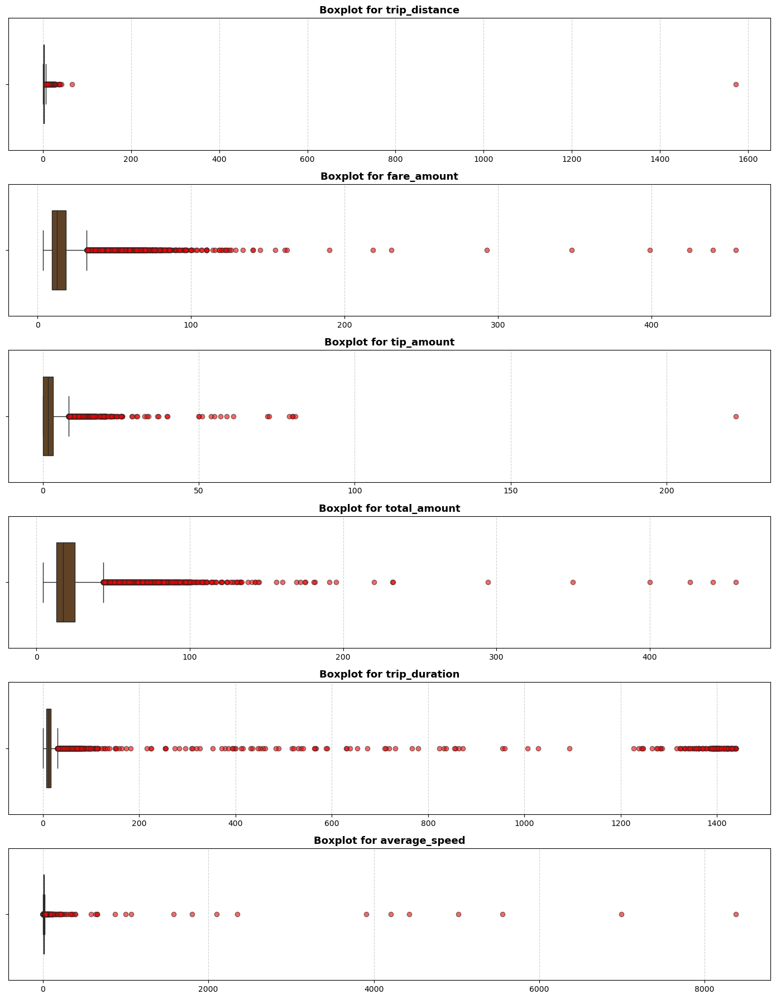

In [189]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_columns = [
    'trip_distance', 'fare_amount', 'tip_amount',
    'total_amount', 'trip_duration', 'average_speed'
]

# Buat subplots
fig, axes = plt.subplots(len(numeric_columns), 1, figsize=(14, 18), sharex=False)

# Warna coklat tua
dark_brown = '#654321'

# Loop setiap kolom dan buat boxplot
for ax, col in zip(axes, numeric_columns):
    sns.boxplot(
        x=df[col],
        ax=ax,
        color=dark_brown,  # Warna boxplot
        saturation=0.85,
        width=0.6,
        flierprops={
            'marker': 'o',
            'markersize': 6,
            'markerfacecolor': 'red',
            'alpha': 0.6
        }
    )
    ax.set_title(f'Boxplot for {col}', fontsize=13, fontweight='bold')
    ax.grid(True, axis='x', linestyle='--', alpha=0.6)
    ax.set_xlabel('')

plt.tight_layout()
plt.show()



Berdasarkan visualisasi boxplot, terdapat sejumlah hal penting terkait distribusi data pada pada objek analisis:

1. **Kedapatan deviasi yang signifikan:**

   * Sebagian besar objek data memperlihatkan keberadaan outlier, ditunjukkan oleh titik-titik yang berada jauh dari badan boxplot. Kondisi ini sangat terlihat pada kolom seperti `trip_distance`, `fare_amount`, `tip_amount`, dan `total_amount`.
   * Outlier ini mencerminkan kasus-kasus perjalanan dengan jarak ekstrem, tarif yang tidak biasa, atau durasi yang sangat panjang.

2. **Outlier Mewakili Nilai yang Tidak Rasional:**

   * Beberapa nilai seperti `fare_amount` yang terlalu rendah atau `trip_distance` yang luar biasa panjang hingga ratusan atau ribuan mil kemungkinan merupakan data yang tidak valid dan perlu dikaji ulang.

3. **Pentingnya Tahapan Normalisasi dan Pembersihan Data:**

   * Mengingat banyaknya outlier yang muncul di berbagai fitur, proses pembersihan dan normalisasi data menjadi langkah penting agar hasil analisis lebih dapat dipercaya dan akurat.




### Outlier Data Handling

In [190]:
# Tampilkan 10 perjalanan dengan durasi > 400 menit, diurutkan berdasarkan durasi
long_duration_low_fare = df[df['trip_duration'] > 400].sort_values(by='trip_duration')

# Tampilkan hasil
long_duration_low_fare.head(10)


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,total_amount_validation,PU_Borough,PU_Zone,PU_ServiceZone,DO_Borough,DO_Zone,DO_ServiceZone,trip_duration,day_of_week,day_type,pickup_hour,pickup_date,average_speed
39544,2,2023-01-21 17:19:27,2023-01-22 00:00:00,N,1.0,198,146,11.06,77.2,0.0,0.5,19.68,0.0,1.0,98.38,1.0,1.0,0.00,98.38,Queens,Ridgewood,Boro Zone,Queens,Long Island City/Queens Plaza,Boro Zone,400.55,Saturday,Weekend,17,21,1.656722
45382,2,2023-01-24 17:08:13,2023-01-25 00:00:00,N,1.0,66,170,5.91,31.0,2.5,0.5,0.00,0.0,1.0,37.75,1.0,1.0,2.75,37.75,Brooklyn,DUMBO/Vinegar Hill,Boro Zone,Manhattan,Murray Hill,Yellow Zone,411.78,Tuesday,Weekday,17,24,0.861139
45280,2,2023-01-24 17:04:23,2023-01-25 00:00:00,N,1.0,95,160,2.35,16.3,2.5,0.5,0.00,0.0,1.0,20.30,1.0,1.0,0.00,20.30,Queens,Forest Hills,Boro Zone,Queens,Middle Village,Boro Zone,415.62,Tuesday,Weekday,17,24,0.339252
43093,2,2023-01-23 16:48:51,2023-01-24 00:00:00,N,1.0,95,121,2.67,14.9,2.5,0.5,0.00,0.0,1.0,18.90,2.0,1.0,0.00,18.90,Queens,Forest Hills,Boro Zone,Queens,Hillcrest/Pomonok,Boro Zone,431.15,Monday,Weekday,16,23,0.371564
23967,2,2023-01-13 16:45:34,2023-01-14 00:00:00,N,1.0,65,261,3.15,18.0,1.0,0.5,6.76,0.0,0.3,29.31,1.0,1.0,2.75,29.31,Brooklyn,Downtown Brooklyn/MetroTech,Boro Zone,Manhattan,World Trade Center,Yellow Zone,434.43,Friday,Weekday,16,13,0.435053
13776,2,2023-01-08 16:34:03,2023-01-09 00:00:00,N,1.0,74,239,3.55,18.4,0.0,0.5,2.26,0.0,1.0,24.91,1.0,1.0,2.75,24.91,Manhattan,East Harlem North,Boro Zone,Manhattan,Upper West Side South,Yellow Zone,445.95,Sunday,Weekend,16,08,0.477632
13759,2,2023-01-08 16:28:51,2023-01-09 00:00:00,N,5.0,33,54,0.27,25.0,0.0,0.0,2.60,0.0,1.0,28.60,1.0,2.0,0.00,28.60,Brooklyn,Brooklyn Heights,Boro Zone,Brooklyn,Columbia Street,Boro Zone,451.15,Sunday,Weekend,16,08,0.035908
7915,2,2023-01-05 16:23:19,2023-01-06 00:00:00,N,1.0,75,230,2.94,18.0,1.0,0.5,4.51,0.0,0.3,27.06,1.0,1.0,2.75,27.06,Manhattan,East Harlem South,Boro Zone,Manhattan,Times Sq/Theatre District,Yellow Zone,456.68,Thursday,Weekday,16,05,0.386266
7265,2,2023-01-05 12:12:49,2023-01-05 19:53:49,N,1.0,223,223,25.48,348.1,0.0,0.5,0.00,0.0,1.0,349.60,2.0,1.0,0.00,349.60,Queens,Steinway,Boro Zone,Queens,Steinway,Boro Zone,461.00,Thursday,Weekday,12,05,3.316269
57327,2,2023-01-30 15:55:56,2023-01-31 00:00:00,N,1.0,42,74,1.28,12.8,0.0,0.5,2.14,0.0,1.0,16.44,1.0,1.0,0.00,16.44,Manhattan,Central Harlem North,Boro Zone,Manhattan,East Harlem North,Boro Zone,484.07,Monday,Weekday,15,30,0.158655


#### Unreasonable Condition Identification

In [191]:
# Definisikan kondisi-kondisi outlier sebagai dataframe terpisah
# Average Speed > 60
unreasonable_speed = df[df['average_speed'] > 60]
unreasonable_speed2 = df[
    (df['average_speed'] < 1) &
    (df['trip_distance'] > 5) &
    (df['trip_duration'] < 5)
]

# Kecepatan tinggi namun jarak sangat pendek
high_speed_short_distance = df[
    (df['average_speed'] > 30) &
    (df['trip_distance'] < 1)
]

# Durasi perjalanan lama dengan jarak sangat pendek
long_duration_short_distance = df[
    (df['trip_duration'] > 120) &
    (df['trip_distance'] < 1)
]

# Durasi perjalanan lama dengan biaya rendah
unreasonable_duration_distance = pd.concat([
    df[(df['trip_duration'] > 500) & (df['trip_distance'] < 20)],
    df[(df['trip_duration'] > 400) & (df['trip_distance'] < 15)]
])

# Durasi perjalanan singkat dengan jarak yang panjang
short_duration_long_distance = df[
    (df['trip_duration'] < 1) &
    (df['trip_distance'] > 5)
]

# Tarif yang tidak masuk akal
unreasonable_fare = pd.concat([
    df[(df['fare_amount'] < 2) & (df['trip_distance'] > 5)], #tarif terlalu murah
    df[(df['fare_amount'] < 20) & (df['trip_distance'] > 60)], #tarif terlalu rendah
    df[(df['fare_amount'] > 50) & (df['trip_distance'] < 2)] #tarif terlalu mahal
])

# Metode pembayaran yang tidak relevan
unreasonable_payment_type = df[
    df['payment_type'].isin([3, 4]) & (df['trip_distance'] > 5) # jarak lebih dari 5 mill, namun payment type nya terisi No Charge
]

# Jarak terlalu pendek, namun tarif terlalu tinggi
zero_distance_high_fare = df[
    (df['trip_distance'] < 0.1) &
    (df['fare_amount'] > 20) &
    (df['trip_duration'] > 10)
]

# Jarak terlalu panjang, namun tarif terlalu rendah
long_trip_unreasonable_fare = df[
    (df['trip_distance'] > 10) &
    (df['fare_amount'] < 10)
]

# Gabungkan semua kondisi menjadi satu dataset
all_unreasonable_outliers = pd.concat([
    unreasonable_speed,
    unreasonable_speed2,
    high_speed_short_distance,
    long_duration_short_distance,
    short_duration_long_distance,
    unreasonable_duration_distance,
    unreasonable_fare,
    unreasonable_payment_type,
    zero_distance_high_fare,
    long_trip_unreasonable_fare
])

# Output jumlah baris outlier teridentifikasi
print(f"Jumlah total outlier logis terdeteksi: {all_unreasonable_outliers.shape[0]}")


Jumlah total outlier logis terdeteksi: 674


#### Unreasonable Condition Handling - Hapus semua Significant Outlier

In [192]:
# drop seluruh outlier
df.drop(all_unreasonable_outliers.index, inplace=True)

In [193]:
df.describe(include=['number'])

,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,total_amount_validation,trip_duration,average_speed
count,59570.000000,59570.000000,59570.000000,59570.000000,59570.000000,59570.000000,59570.000000,59570.000000,59570.000000,59570.000000,59570.000000,59570.000000
mean,2.657244,15.701248,0.919939,0.619414,2.108332,0.125738,0.956151,20.966234,0.768336,21.199158,13.402899,11.735384
std,2.485710,10.718152,1.305717,0.338072,2.908557,0.929261,0.170335,12.914629,1.233872,12.968323,10.640044,5.134642
min,0.010000,3.500000,0.000000,0.000000,0.000000,0.000000,0.000000,4.300000,0.000000,4.300000,0.030000,0.026178
25%,1.210000,9.300000,0.000000,0.500000,0.000000,0.000000,1.000000,12.850000,0.000000,12.900000,7.320000,8.508791
50%,1.890000,12.800000,0.000000,0.500000,1.720000,0.000000,1.000000,17.500000,0.000000,17.680000,11.150000,10.565958
75%,3.150000,18.400000,2.500000,0.500000,3.300000,0.000000,1.000000,25.200000,2.750000,25.560000,16.630000,13.521831
max,41.740000,348.100000,7.500000,1.500000,222.220000,36.050000,1.000000,349.600000,2.750000,349.600000,461.000000,57.142857


#### Boxplot Analysis After Outlier Handling

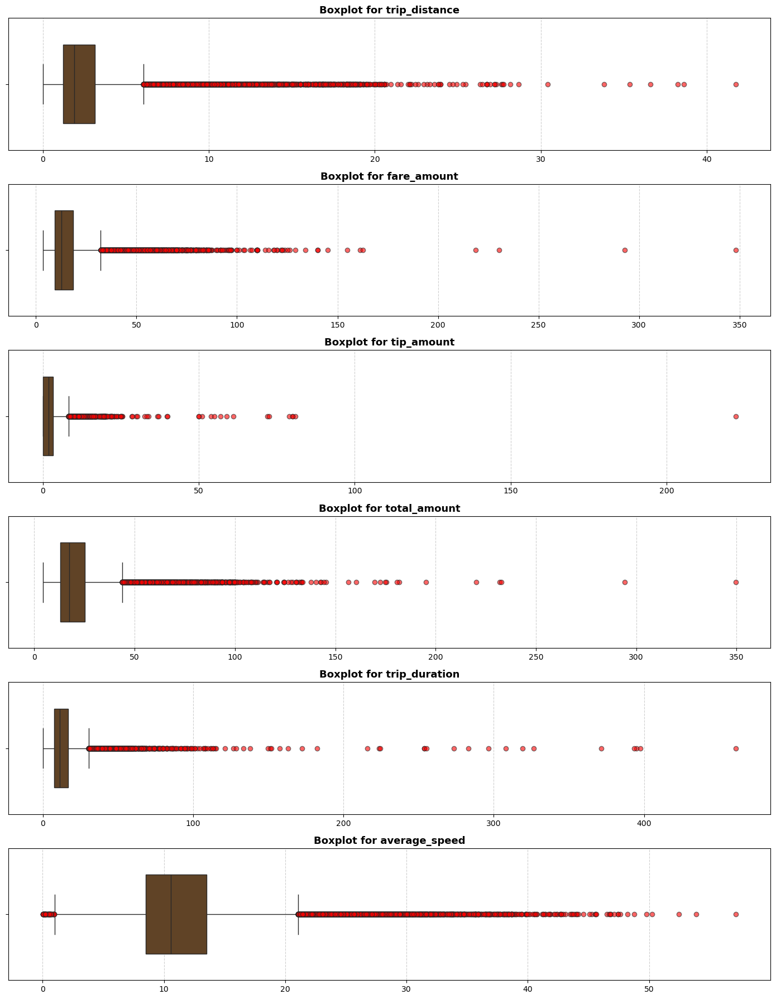

In [194]:
import matplotlib.pyplot as plt
import seaborn as sns

# Daftar kolom numerik untuk visualisasi
numeric_columns = [
    'trip_distance', 'fare_amount', 'tip_amount',
    'total_amount', 'trip_duration', 'average_speed'
]

# Warna coklat tua
dark_brown = '#654321'

# Buat subplots
fig, axes = plt.subplots(len(numeric_columns), 1, figsize=(14, 18), sharex=False)

# Loop untuk setiap kolom dan buat boxplot
for ax, col in zip(axes, numeric_columns):
    sns.boxplot(
        x=df[col],
        ax=ax,
        color=dark_brown,  # warna coklat tua
        saturation=0.85,
        width=0.6,
        flierprops={
            'marker': 'o',
            'markersize': 6,
            'markerfacecolor': 'red',
            'alpha': 0.6
        }
    )
    ax.set_title(f'Boxplot for {col}', fontsize=13, fontweight='bold')
    ax.grid(True, axis='x', linestyle='--', alpha=0.6)
    ax.set_xlabel('')

# Tata letak rapi
plt.tight_layout()
plt.show()


### Analisis Korelasi - Scatter Plot

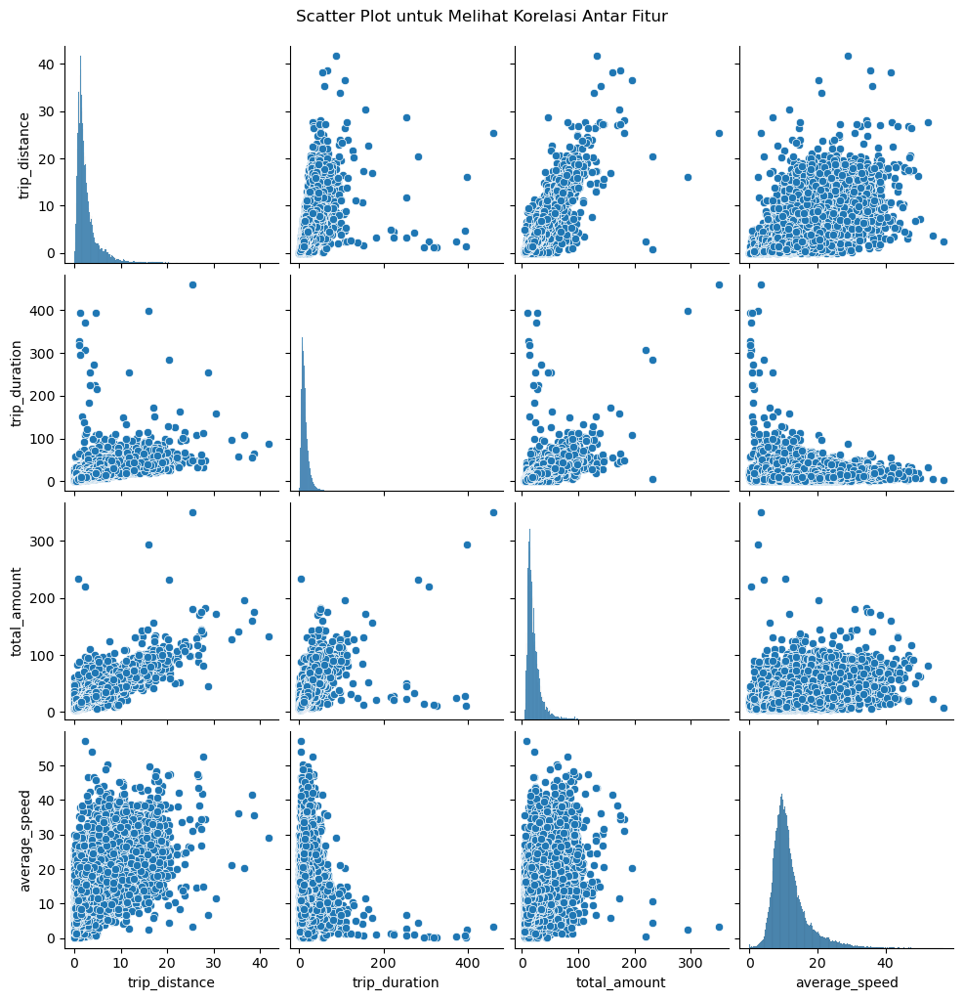

In [195]:

# Daftar fitur numerik yang dianalisis
numerical_features = ['trip_distance', 'trip_duration', 'total_amount', 'average_speed']

# Buat pairplot
sns.pairplot(df[numerical_features])
plt.suptitle("Scatter Plot untuk Melihat Korelasi Antar Fitur", y=1.02)
plt.show()


Berdasarkan **pairplot** tersebut, berikut adalah **analisis hubungan antar fitur numerik** :

🔍 1. **`trip_distance` vs `total_amount`**

* Terdapat **korelasi positif** yang jelas: semakin jauh perjalanan, semakin besar biaya total.
* Meskipun begitu, ada **outlier** berupa perjalanan sangat mahal untuk jarak pendek → indikasi anomali atau biaya tambahan tinggi (tol, tip besar, dsb).

---

🔍 2. **`trip_distance` vs `trip_duration`**

* Hubungan **tidak linear sempurna**, tapi terlihat bahwa semakin jauh jarak, umumnya durasi lebih panjang.
* Terdapat beberapa perjalanan dengan **durasi sangat lama tapi jarak pendek**, yang patut dicurigai sebagai **data tidak valid atau macet ekstrem**.

---

🔍 3. **`trip_duration` vs `total_amount`**

* Hubungan ini **lebih tersebar**. Tidak semua perjalanan dengan durasi lama memiliki total biaya tinggi.
* Ini wajar karena tarif taksi lebih bergantung pada **jarak** daripada waktu (kecuali dalam macet berat atau saat idle).

---

🔍 4. **`average_speed` vs fitur lainnya**

* `average_speed` vs `trip_distance` dan `trip_duration`:

  * Tidak menunjukkan korelasi kuat. Banyak titik terdistribusi acak.
  * Ada indikasi **kecepatan sangat tinggi atau sangat rendah** yang tidak konsisten dengan jarak/durasi → perlu ditinjau sebagai outlier.

* `average_speed` vs `total_amount`:

  * Hampir tidak ada korelasi langsung. Logis, karena kecepatan tidak memengaruhi tarif secara langsung di NYC.

---

🔍 5. **Distribusi Individual (diagonal plot)**

* Semua fitur numerik sangat **right-skewed** (condong ke kiri):

  * Banyak perjalanan pendek dengan sedikit biaya.
  * Beberapa nilai ekstrem (outlier) untuk durasi, jarak, dan total\_amount → kemungkinan data noise atau perjalanan tidak umum.

---


In [196]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 59570 entries, 0 to 60258
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   VendorID                 59570 non-null  category      
 1   lpep_pickup_datetime     59570 non-null  datetime64[ns]
 2   lpep_dropoff_datetime    59570 non-null  datetime64[ns]
 3   store_and_fwd_flag       59570 non-null  category      
 4   RatecodeID               59570 non-null  category      
 5   PULocationID             59570 non-null  category      
 6   DOLocationID             59570 non-null  category      
 7   trip_distance            59570 non-null  float64       
 8   fare_amount              59570 non-null  float64       
 9   extra                    59570 non-null  float64       
 10  mta_tax                  59570 non-null  float64       
 11  tip_amount               59570 non-null  float64       
 12  tolls_amount             59570 non-nu

In [197]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 59570 entries, 0 to 60258
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   VendorID                 59570 non-null  category      
 1   lpep_pickup_datetime     59570 non-null  datetime64[ns]
 2   lpep_dropoff_datetime    59570 non-null  datetime64[ns]
 3   store_and_fwd_flag       59570 non-null  category      
 4   RatecodeID               59570 non-null  category      
 5   PULocationID             59570 non-null  category      
 6   DOLocationID             59570 non-null  category      
 7   trip_distance            59570 non-null  float64       
 8   fare_amount              59570 non-null  float64       
 9   extra                    59570 non-null  float64       
 10  mta_tax                  59570 non-null  float64       
 11  tip_amount               59570 non-null  float64       
 12  tolls_amount             59570 non-nu

In [200]:
df.drop(columns='pickup_date_dt', errors='ignore', inplace=True)


In [202]:
df.info()
df.to_csv("Data_for_Tableu", index=False)


<class 'pandas.core.frame.DataFrame'>
Index: 59570 entries, 0 to 60258
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   VendorID                 59570 non-null  category      
 1   lpep_pickup_datetime     59570 non-null  datetime64[ns]
 2   lpep_dropoff_datetime    59570 non-null  datetime64[ns]
 3   store_and_fwd_flag       59570 non-null  category      
 4   RatecodeID               59570 non-null  category      
 5   PULocationID             59570 non-null  category      
 6   DOLocationID             59570 non-null  category      
 7   trip_distance            59570 non-null  float64       
 8   fare_amount              59570 non-null  float64       
 9   extra                    59570 non-null  float64       
 10  mta_tax                  59570 non-null  float64       
 11  tip_amount               59570 non-null  float64       
 12  tolls_amount             59570 non-nu

# DATA VISUALISATION & ANALYSIS

## Visualisasi Frekuensi Penjemputan Berdasarkan Hari dalam Seminggu

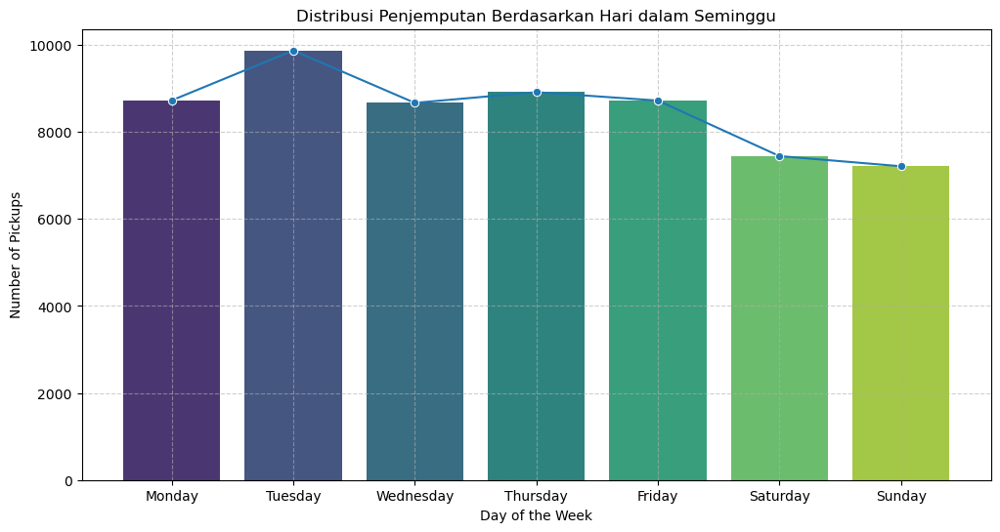

In [ ]:
# Visualisasi distribusi penjemputan berdasarkan hari
plt.figure(figsize=(12, 6))
sns.countplot(x='day_of_week', data=df, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], palette='viridis')
sns.lineplot(x=df['day_of_week'].value_counts().sort_index().index, y=df['day_of_week'].value_counts().sort_index().values, marker='o', palette='viridis')

plt.title('Distribusi Penjemputan Berdasarkan Hari dalam Seminggu')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Pickups')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

📊 Analisis:

Hari Tersibuk:
Penjemputan tertinggi terjadi pada hari Selasa, dengan jumlah pickup mendekati 10.000.

Hari Kerja (Weekdays):
Volume penjemputan stabil dan tinggi dari Senin hingga Jumat, menunjukkan pola aktivitas yang kuat di hari kerja.

Akhir Pekan (Weekend):
Terjadi penurunan signifikan pada hari Sabtu dan Minggu, masing-masing di bawah 7.500 pickup, menandakan aktivitas transportasi menurun di akhir pekan.

Kecenderungan Umum:
Grafik menunjukkan bentuk menurun dari Selasa ke Minggu, mencerminkan penurunan permintaan layanan taksi setelah awal minggu.

## Visualisasi Distribusi Waktu Penjemputan di Weekdays dan Weekend

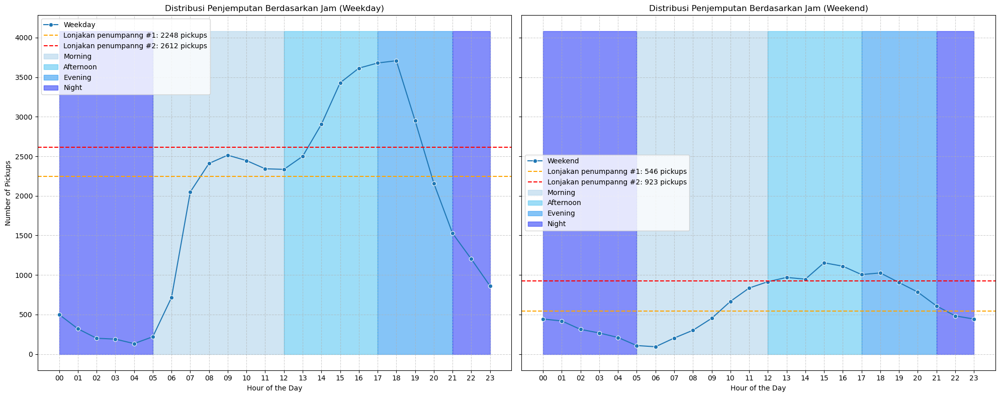

In [ ]:
# Menghitung jumlah penjemputan berdasarkan jam untuk weekday dan weekend
weekday_pickups = df[df['day_type'] == 'Weekday']['pickup_hour'].value_counts().sort_index()
weekend_pickups = df[df['day_type'] == 'Weekend']['pickup_hour'].value_counts().sort_index()

weekday_pickups_index = weekday_pickups.index.astype(int)
weekend_pickups_index = weekend_pickups.index.astype(int)

# Menentukan threshold untuk weekday
weekday_threshold_first = weekday_pickups.quantile(0.5)
weekday_threshold_second = weekday_pickups.quantile(0.75)

# Menentukan threshold untuk weekend
weekend_threshold_first = weekend_pickups.quantile(0.5)
weekend_threshold_second = weekend_pickups.quantile(0.75)

# Plot untuk Weekday
fig, axes = plt.subplots(1, 2, figsize=(20, 8), sharey=True)

# Plot untuk Weekday
sns.lineplot(ax=axes[0], x=weekday_pickups.index, y=weekday_pickups.values, marker='o', palette='Set2', label='Weekday')
axes[0].axhline(y=weekday_threshold_first, color='orange', linestyle='--', label=f'Lonjakan penumpanng #1: {round(weekday_threshold_first)} pickups')
axes[0].axhline(y=weekday_threshold_second, color='red', linestyle='--', label=f'Lonjakan penumpanng #2: {round(weekday_threshold_second)} pickups')

axes[0].fill_between(weekday_pickups_index, 0, weekday_pickups.values.max() *1.1, 
                     where=(weekday_pickups_index >= 5) & (weekday_pickups_index <= 12), color="#A2CCE8", alpha=0.5, label='Morning')
axes[0].fill_between(weekday_pickups_index, 0, weekday_pickups.values.max() *1.1, 
                     where=(weekday_pickups_index >= 12) & (weekday_pickups_index <= 17), color="#3CBDF0", alpha=0.5, label='Afternoon')
axes[0].fill_between(weekday_pickups_index, 0, weekday_pickups.values.max() *1.1, 
                     where=(weekday_pickups_index >= 17) & (weekday_pickups_index <= 21), color="#0C8AF0", alpha=0.5, label='Evening')
axes[0].fill_between(weekday_pickups_index, 0, weekday_pickups.values.max() *1.1, 
                     where=(weekday_pickups_index >= 21) | (weekday_pickups_index <= 5), color="#081CF7", alpha=0.5, label='Night')

axes[0].set_title('Distribusi Penjemputan Berdasarkan Jam (Weekday)')
axes[0].set_xlabel('Hour of the Day')
axes[0].set_ylabel('Number of Pickups')
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[0].set_xticks(range(0, 24))
axes[0].legend(loc='upper left')

# Plot untuk Weekend
sns.lineplot(ax=axes[1], x=weekend_pickups.index, y=weekend_pickups.values, marker='o', palette='Set3', label='Weekend')
axes[1].axhline(y=weekend_threshold_first, color='orange', linestyle='--', label=f'Lonjakan penumpanng #1: {round(weekend_threshold_first)} pickups')
axes[1].axhline(y=weekend_threshold_second, color='red', linestyle='--', label=f'Lonjakan penumpanng #2: {round(weekend_threshold_second)} pickups')

axes[1].fill_between(weekend_pickups_index, 0, weekday_pickups.values.max() *1.1, 
                     where=(weekend_pickups_index >= 5) & (weekend_pickups_index <= 12), color='#A2CCE8', alpha=0.5, label='Morning')
axes[1].fill_between(weekend_pickups_index, 0, weekday_pickups.values.max() *1.1, 
                     where=(weekend_pickups_index >= 12) & (weekend_pickups_index <= 17), color='#3CBDF0', alpha=0.5, label='Afternoon')
axes[1].fill_between(weekend_pickups_index, 0, weekday_pickups.values.max() *1.1, 
                     where=(weekend_pickups_index >= 17) & (weekend_pickups_index <= 21), color='#0C8AF0', alpha=0.5, label='Evening')
axes[1].fill_between(weekend_pickups_index, 0, weekday_pickups.values.max() *1.1, 
                     where=(weekend_pickups_index >= 21) | (weekend_pickups_index <= 5), color='#081CF7', alpha=0.5, label='Night')

axes[1].set_title('Distribusi Penjemputan Berdasarkan Jam (Weekend)')
axes[1].set_xlabel('Hour of the Day')
axes[1].grid(True, linestyle='--', alpha=0.6)
axes[1].set_xticks(range(0, 24))
axes[1].legend()

plt.tight_layout()
plt.show()

📊 Analisis Visual
🔹 Weekday (Hari Kerja):
Lonjakan utama terjadi pada dua waktu:

Pagi (07:00–09:00) — didominasi aktivitas berangkat kerja.

Sore (17:00–19:00) — mencerminkan arus pulang kerja.

Jumlah pickup meningkat tajam setelah pukul 06:00, mencapai puncak sekitar pukul 17:00–18:00.

Setelah pukul 21:00, terjadi penurunan tajam.

🔸 Weekend (Akhir Pekan):
Distribusi pickup lebih merata sepanjang hari.

Puncak ringan terjadi antara pukul 14:00–16:00, kemungkinan terkait aktivitas sosial atau rekreasi.

Tidak ada lonjakan tajam seperti pada weekday.

## Visualisasi Distribusi Rata - Rata Panjang Perjalanan di Weekdays dan Weekend

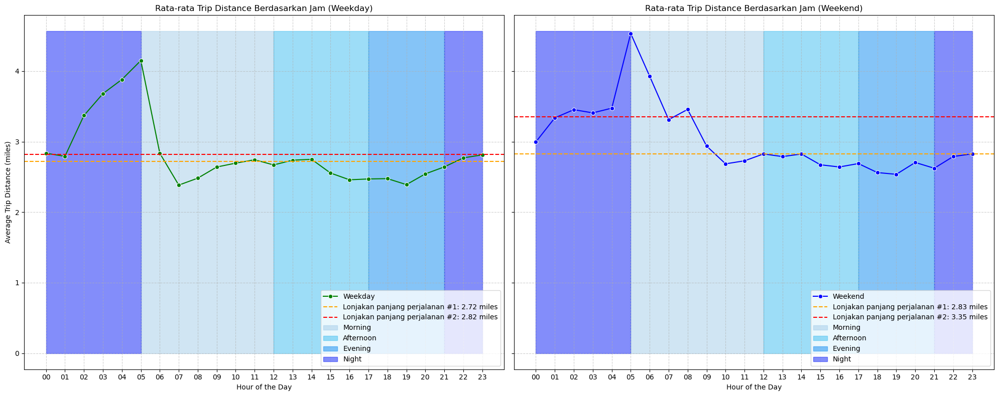

In [ ]:
weekday_avg_distance = df[df['day_type'] == 'Weekday'].groupby('pickup_hour')['trip_distance'].mean().sort_index()
weekend_avg_distance = df[df['day_type'] == 'Weekend'].groupby('pickup_hour')['trip_distance'].mean().sort_index()

weekday_pickups_index = weekday_avg_distance.index.astype(int)
weekend_pickups_index = weekend_avg_distance.index.astype(int)

# Menentukan threshold untuk weekday trip_distance
weekday_distance_threshold_first = weekday_avg_distance.quantile(0.5)
weekday_distance_threshold_second = weekday_avg_distance.quantile(0.75)

# Menentukan threshold untuk weekend trip_distance
weekend_distance_threshold_first = weekend_avg_distance.quantile(0.5)
weekend_distance_threshold_second = weekend_avg_distance.quantile(0.75)

fig, axes = plt.subplots(1, 2, figsize=(20, 8), sharey=True)

# Plot untuk Weekday
sns.lineplot(ax=axes[0], x=weekday_avg_distance.index, y=weekday_avg_distance.values, marker='o', color='green', label='Weekday')
axes[0].axhline(y=weekday_distance_threshold_first, color='orange', linestyle='--', label=f'Lonjakan panjang perjalanan #1: {round(weekday_distance_threshold_first, 2)} miles')
axes[0].axhline(y=weekday_distance_threshold_second, color='red', linestyle='--', label=f'Lonjakan panjang perjalanan #2: {round(weekday_distance_threshold_second, 2)} miles')

axes[0].fill_between(weekday_pickups_index, 0, weekday_avg_distance.values.max() * 1.1, 
                     where=(weekday_pickups_index >= 5) & (weekday_pickups_index <= 12), color='#A2CCE8', alpha=0.5, label='Morning')
axes[0].fill_between(weekday_pickups_index, 0, weekday_avg_distance.values.max() * 1.1, 
                     where=(weekday_pickups_index >= 12) & (weekday_pickups_index <= 17), color='#3CBDF0', alpha=0.5, label='Afternoon')
axes[0].fill_between(weekday_pickups_index, 0, weekday_avg_distance.values.max() * 1.1, 
                     where=(weekday_pickups_index >= 17) & (weekday_pickups_index <= 21), color='#0C8AF0', alpha=0.5, label='Evening')
axes[0].fill_between(weekday_pickups_index, 0, weekday_avg_distance.values.max() * 1.1, 
                     where=(weekday_pickups_index >= 21) | (weekday_pickups_index <= 5), color='#081CF7', alpha=0.5, label='Night')

axes[0].set_title('Rata-rata Trip Distance Berdasarkan Jam (Weekday)')
axes[0].set_xlabel('Hour of the Day')
axes[0].set_ylabel('Average Trip Distance (miles)')
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[0].set_xticks(range(0, 24))
axes[0].legend(loc='lower right')

# Plot untuk Weekend
sns.lineplot(ax=axes[1], x=weekend_avg_distance.index, y=weekend_avg_distance.values, marker='o', color='blue', label='Weekend')
axes[1].axhline(y=weekend_distance_threshold_first, color='orange', linestyle='--', label=f'Lonjakan panjang perjalanan #1: {round(weekend_distance_threshold_first, 2)} miles')
axes[1].axhline(y=weekend_distance_threshold_second, color='red', linestyle='--', label=f'Lonjakan panjang perjalanan #2: {round(weekend_distance_threshold_second, 2)} miles')

axes[1].fill_between(weekend_pickups_index, 0, weekday_avg_distance.values.max() * 1.1, 
                     where=(weekend_pickups_index >= 5) & (weekend_pickups_index <= 12), color='#A2CCE8', alpha=0.5, label='Morning')
axes[1].fill_between(weekend_pickups_index, 0, weekday_avg_distance.values.max() * 1.1, 
                     where=(weekend_pickups_index >= 12) & (weekend_pickups_index <= 17), color='#3CBDF0', alpha=0.5, label='Afternoon')
axes[1].fill_between(weekend_pickups_index, 0, weekday_avg_distance.values.max() * 1.1, 
                     where=(weekend_pickups_index >= 17) & (weekend_pickups_index <= 21), color='#0C8AF0', alpha=0.5, label='Evening')
axes[1].fill_between(weekend_pickups_index, 0, weekday_avg_distance.values.max() * 1.1, 
                     where=(weekend_pickups_index >= 21) | (weekend_pickups_index <= 5), color='#081CF7', alpha=0.5, label='Night')

axes[1].set_title('Rata-rata Trip Distance Berdasarkan Jam (Weekend)')
axes[1].set_xlabel('Hour of the Day')
axes[1].grid(True, linestyle='--', alpha=0.6)
axes[1].set_xticks(range(0, 24))
axes[1].legend(loc='lower right')

plt.tight_layout()
plt.show()


📊 Analisis Visual

🔹 Weekday (Hari Kerja):
Panjang perjalanan tertinggi terjadi dini hari (01:00–05:00), dengan rata-rata mencapai 4.1 miles.

Setelah pukul 06:00, jarak menurun dan stabil di bawah 3 miles sepanjang siang dan malam.

Jarak tempuh konsisten pendek selama jam kerja dan sore hari, mencerminkan perjalanan lokal (komuter).

🔸 Weekend (Akhir Pekan):
Lonjakan tertinggi juga terjadi pada dini hari (sekitar pukul 05:00), mencapai hingga 4.5 miles.

Siang dan sore hari menunjukkan penurunan ke kisaran 2.7–2.9 miles, dan relatif stabil sepanjang hari.

Tidak ada penurunan signifikan seperti pada weekday.

## Visualisasi Distribusi Pendapatan per perjalanan rata-rata pada Weekend Weekday

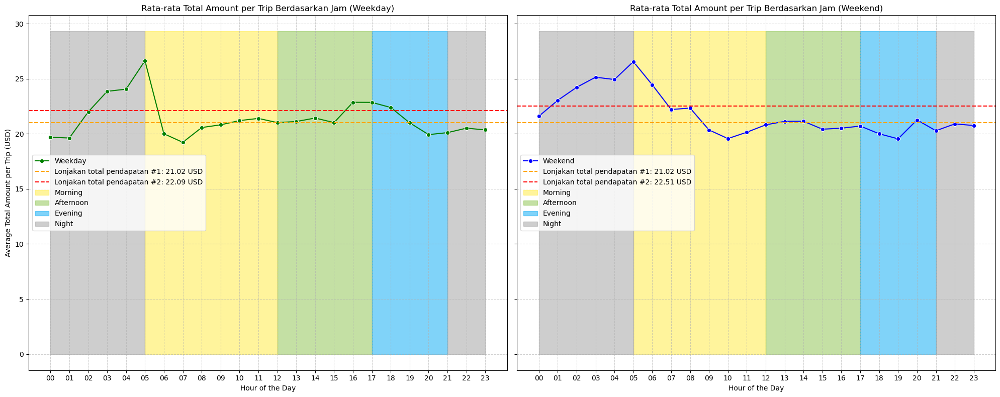

In [ ]:
weekday_avg_amount = df[df['day_type'] == 'Weekday'].groupby('pickup_hour')['total_amount'].mean().sort_index()
weekend_avg_amount = df[df['day_type'] == 'Weekend'].groupby('pickup_hour')['total_amount'].mean().sort_index()

weekday_pickups_index = weekday_avg_amount.index.astype(int)
weekend_pickups_index = weekend_avg_amount.index.astype(int)

# Menentukan threshold untuk weekday total_amount
weekday_amount_threshold_first = weekday_avg_amount.quantile(0.5)
weekday_amount_threshold_second = weekday_avg_amount.quantile(0.75)

# Menentukan threshold untuk weekend total_amount
weekend_amount_threshold_first = weekend_avg_amount.quantile(0.5)
weekend_amount_threshold_second = weekend_avg_amount.quantile(0.75)

# Plot untuk Weekday dan Weekend total_amount berdampingan
fig, axes = plt.subplots(1, 2, figsize=(20, 8), sharey=True)

# Plot untuk Weekday
sns.lineplot(ax=axes[0], x=weekday_avg_amount.index, y=weekday_avg_amount.values, marker='o', color='green', label='Weekday')
axes[0].axhline(y=weekday_amount_threshold_first, color='orange', linestyle='--', label=f'Lonjakan total pendapatan #1: {round(weekday_amount_threshold_first, 2)} USD')
axes[0].axhline(y=weekday_amount_threshold_second, color='red', linestyle='--', label=f'Lonjakan total pendapatan #2: {round(weekday_amount_threshold_second, 2)} USD')

axes[0].fill_between(weekday_pickups_index, 0, weekday_avg_amount.values.max() * 1.1, 
                     where=(weekday_pickups_index >= 5) & (weekday_pickups_index <= 12), color='#FFEB3B', alpha=0.5, label='Morning')
axes[0].fill_between(weekday_pickups_index, 0, weekday_avg_amount.values.max() * 1.1, 
                     where=(weekday_pickups_index >= 12) & (weekday_pickups_index <= 17), color='#8BC34A', alpha=0.5, label='Afternoon')
axes[0].fill_between(weekday_pickups_index, 0, weekday_avg_amount.values.max() * 1.1, 
                     where=(weekday_pickups_index >= 17) & (weekday_pickups_index <= 21), color='#03A9F4', alpha=0.5, label='Evening')
axes[0].fill_between(weekday_pickups_index, 0, weekday_avg_amount.values.max() * 1.1, 
                     where=(weekday_pickups_index >= 21) | (weekday_pickups_index <= 5), color='#9E9E9E', alpha=0.5, label='Night')

axes[0].set_title('Rata-rata Total Amount per Trip Berdasarkan Jam (Weekday)')
axes[0].set_xlabel('Hour of the Day')
axes[0].set_ylabel('Average Total Amount per Trip (USD)')
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[0].set_xticks(range(0, 24))
axes[0].legend()

# Plot untuk Weekend
sns.lineplot(ax=axes[1], x=weekend_avg_amount.index, y=weekend_avg_amount.values, marker='o', color='blue', label='Weekend')
axes[1].axhline(y=weekend_amount_threshold_first, color='orange', linestyle='--', label=f'Lonjakan total pendapatan #1: {round(weekend_amount_threshold_first, 2)} USD')
axes[1].axhline(y=weekend_amount_threshold_second, color='red', linestyle='--', label=f'Lonjakan total pendapatan #2: {round(weekend_amount_threshold_second, 2)} USD')

axes[1].fill_between(weekend_pickups_index, 0, weekday_avg_amount.values.max() * 1.1, 
                     where=(weekend_pickups_index >= 5) & (weekend_pickups_index <= 12), color='#FFEB3B', alpha=0.5, label='Morning')
axes[1].fill_between(weekend_pickups_index, 0, weekday_avg_amount.values.max() * 1.1, 
                     where=(weekend_pickups_index >= 12) & (weekend_pickups_index <= 17), color='#8BC34A', alpha=0.5, label='Afternoon')
axes[1].fill_between(weekend_pickups_index, 0, weekday_avg_amount.values.max() * 1.1, 
                     where=(weekend_pickups_index >= 17) & (weekend_pickups_index <= 21), color='#03A9F4', alpha=0.5, label='Evening')
axes[1].fill_between(weekend_pickups_index, 0, weekday_avg_amount.values.max() * 1.1, 
                     where=(weekend_pickups_index >= 21) | (weekend_pickups_index <= 5), color='#9E9E9E', alpha=0.5, label='Night')

axes[1].set_title('Rata-rata Total Amount per Trip Berdasarkan Jam (Weekend)')
axes[1].set_xlabel('Hour of the Day')
axes[1].grid(True, linestyle='--', alpha=0.6)
axes[1].set_xticks(range(0, 24))
axes[1].legend()

plt.tight_layout()
plt.show()

📊 Analisis Visual: Rata-rata Total Pendapatan & Lonjakan Penumpang

🔹 Weekday:
Lonjakan penumpang terjadi pada dua periode:

07:00–09:00 → jam sibuk pagi saat pekerja berangkat.

17:00–19:00 → jam sibuk sore hari.

Namun, rata-rata total amount per trip justru tertinggi pada pukul 05:00 (~$26.7), lalu menurun saat lonjakan penumpang dimulai.

Artinya, saat jumlah penumpang naik (jam sibuk), pendapatan per trip cenderung lebih rendah → kemungkinan karena perjalanan yang lebih pendek atau diskon tarif standar.

🔸 Weekend:
Lonjakan penumpang lebih merata dan tidak setinggi weekday, dengan puncak sekitar pukul 15:00–17:00.

Rata-rata total amount per trip juga tinggi pada pukul 05:00, lalu menurun namun stabil hingga malam.

Tidak ada perbedaan mencolok antara jumlah penumpang dan rata-rata trip di sepanjang hari.

## Visualisasi Distribusi Pendapatan per Hari pada Weekend Weekday

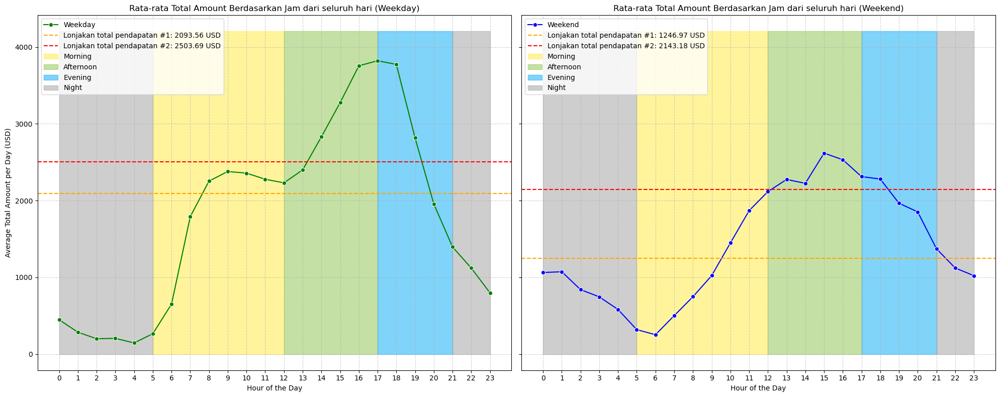

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Menghitung jumlah hari weekday dan weekend dalam dataset
weekday_days = df[df['day_type'] == 'Weekday']['lpep_pickup_datetime'].dt.date.nunique()
weekend_days = df[df['day_type'] == 'Weekend']['lpep_pickup_datetime'].dt.date.nunique()

# Menghitung total pendapatan per jam untuk weekday dan weekend
weekday_total_amount = df[df['day_type'] == 'Weekday'].groupby('pickup_hour')['total_amount'].sum().sort_index()
weekend_total_amount = df[df['day_type'] == 'Weekend'].groupby('pickup_hour')['total_amount'].sum().sort_index()

# Menghitung rata-rata dari seluruh hari pada jam-jam tersebut
weekday_avg_amount_per_hour = (weekday_total_amount / weekday_days).astype(float)
weekend_avg_amount_per_hour = (weekend_total_amount / weekend_days).astype(float)

# Pastikan index berbentuk integer
weekday_avg_amount_per_hour.index = weekday_avg_amount_per_hour.index.astype(int)
weekend_avg_amount_per_hour.index = weekend_avg_amount_per_hour.index.astype(int)

# Menentukan threshold untuk weekday total_amount
weekday_amount_threshold_first = weekday_avg_amount_per_hour.quantile(0.5)
weekday_amount_threshold_second = weekday_avg_amount_per_hour.quantile(0.75)

# Menentukan threshold untuk weekend total_amount
weekend_amount_threshold_first = weekend_avg_amount_per_hour.quantile(0.5)
weekend_amount_threshold_second = weekend_avg_amount_per_hour.quantile(0.75)

# Plot untuk Weekday dan Weekend total_amount berdampingan
fig, axes = plt.subplots(1, 2, figsize=(20, 8), sharey=True)

# Plot untuk Weekday
sns.lineplot(ax=axes[0], x=weekday_avg_amount_per_hour.index, y=weekday_avg_amount_per_hour.values, marker='o', color='green', label='Weekday')
axes[0].axhline(y=weekday_amount_threshold_first, color='orange', linestyle='--', label=f'Lonjakan total pendapatan #1: {round(weekday_amount_threshold_first, 2)} USD')
axes[0].axhline(y=weekday_amount_threshold_second, color='red', linestyle='--', label=f'Lonjakan total pendapatan #2: {round(weekday_amount_threshold_second, 2)} USD')

axes[0].fill_between(weekday_avg_amount_per_hour.index, 0, weekday_avg_amount_per_hour.values.max() * 1.1, 
                     where=(weekday_avg_amount_per_hour.index >= 5) & (weekday_avg_amount_per_hour.index <= 12), color='#FFEB3B', alpha=0.5, label='Morning')
axes[0].fill_between(weekday_avg_amount_per_hour.index, 0, weekday_avg_amount_per_hour.values.max() * 1.1, 
                     where=(weekday_avg_amount_per_hour.index >= 12) & (weekday_avg_amount_per_hour.index <= 17), color='#8BC34A', alpha=0.5, label='Afternoon')
axes[0].fill_between(weekday_avg_amount_per_hour.index, 0, weekday_avg_amount_per_hour.values.max() * 1.1, 
                     where=(weekday_avg_amount_per_hour.index >= 17) & (weekday_avg_amount_per_hour.index <= 21), color='#03A9F4', alpha=0.5, label='Evening')
axes[0].fill_between(weekday_avg_amount_per_hour.index, 0, weekday_avg_amount_per_hour.values.max() * 1.1, 
                     where=(weekday_avg_amount_per_hour.index >= 21) | (weekday_avg_amount_per_hour.index <= 5), color='#9E9E9E', alpha=0.5, label='Night')

axes[0].set_title('Rata-rata Total Amount Berdasarkan Jam dari seluruh hari (Weekday)')
axes[0].set_xlabel('Hour of the Day')
axes[0].set_ylabel('Average Total Amount per Day (USD)')
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[0].set_xticks(range(0, 24))
axes[0].legend(loc='upper left')

# Plot untuk Weekend
sns.lineplot(ax=axes[1], x=weekend_avg_amount_per_hour.index, y=weekend_avg_amount_per_hour.values, marker='o', color='blue', label='Weekend')
axes[1].axhline(y=weekend_amount_threshold_first, color='orange', linestyle='--', label=f'Lonjakan total pendapatan #1: {round(weekend_amount_threshold_first, 2)} USD')
axes[1].axhline(y=weekend_amount_threshold_second, color='red', linestyle='--', label=f'Lonjakan total pendapatan #2: {round(weekend_amount_threshold_second, 2)} USD')

axes[1].fill_between(weekend_avg_amount_per_hour.index, 0, weekday_avg_amount_per_hour.values.max() * 1.1, 
                     where=(weekend_avg_amount_per_hour.index >= 5) & (weekend_avg_amount_per_hour.index <= 12), color='#FFEB3B', alpha=0.5, label='Morning')
axes[1].fill_between(weekend_avg_amount_per_hour.index, 0, weekday_avg_amount_per_hour.values.max() * 1.1, 
                     where=(weekend_avg_amount_per_hour.index >= 12) & (weekend_avg_amount_per_hour.index <= 17), color='#8BC34A', alpha=0.5, label='Afternoon')
axes[1].fill_between(weekend_avg_amount_per_hour.index, 0, weekday_avg_amount_per_hour.values.max() * 1.1, 
                     where=(weekend_avg_amount_per_hour.index >= 17) & (weekend_avg_amount_per_hour.index <= 21), color='#03A9F4', alpha=0.5, label='Evening')
axes[1].fill_between(weekend_avg_amount_per_hour.index, 0, weekday_avg_amount_per_hour.values.max() * 1.1, 
                     where=(weekend_avg_amount_per_hour.index >= 21) | (weekend_avg_amount_per_hour.index <= 5), color='#9E9E9E', alpha=0.5, label='Night')

axes[1].set_title('Rata-rata Total Amount Berdasarkan Jam dari seluruh hari (Weekend)')
axes[1].set_xlabel('Hour of the Day')
axes[1].grid(True, linestyle='--', alpha=0.6)
axes[1].set_xticks(range(0, 24))
axes[1].legend(loc='upper left')

plt.tight_layout()
plt.show()

📊 Analisis Visualisasi Pendapatan Harian berdasarkan Jam

🔹 Weekday:
Lonjakan pendapatan terjadi pada:

Pagi (08:00–09:00): sekitar $2,300–$2,400

Sore (16:00–18:00): mencapai puncak tertinggi hingga $3,800+

Pola ini selaras dengan jam sibuk pekerja berangkat dan pulang kantor.

Jam dini hari (00:00–05:00) menunjukkan aktivitas rendah di bawah $500/hari.

🔸 Weekend:
Pola lebih datar dengan puncak pendapatan pada pukul 15:00–17:00, mencapai $2,100+.

Aktivitas malam dan dini hari tetap rendah, mirip weekday.

Tidak ada lonjakan setinggi weekday karena distribusi penumpang lebih merata sepanjang hari.



## Visualisasi Analisis Hubungan Jam Penjemputan dan Hari Penjemputan

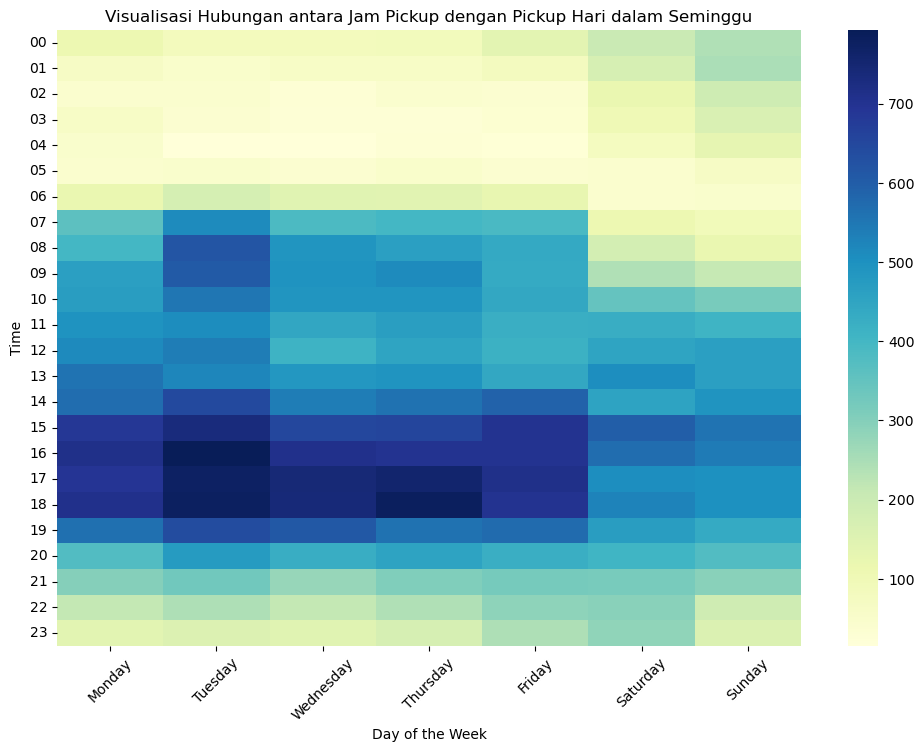

In [ ]:
pivot_table = df.pivot_table(index='pickup_hour', columns='day_of_week', aggfunc='size', fill_value=0)

# Mengurutkan hari dalam urutan yang benar
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pivot_table = pivot_table[ordered_days]

# Visualisasi dengan heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='YlGnBu', fmt="d", cbar=True)

# Menambahkan label, grid, dan judul
plt.title('Visualisasi Hubungan antara Jam Pickup dengan Pickup Hari dalam Seminggu')
plt.xlabel('Day of the Week')
plt.ylabel('Time')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

📊 Analisis Visualisasi
Jam Sibuk (Peak Hours):

Pagi hari (08:00–10:00): Aktivitas tinggi pada weekday, khususnya Selasa hingga Kamis.

Sore hari (15:00–18:00): Lonjakan sangat dominan, terutama Selasa, Rabu, dan Kamis.

Sabtu & Minggu menunjukkan pola yang lebih seimbang, tetapi dengan intensitas pickup yang sedikit lebih rendah dibanding weekday.

Jam Sepi (Off-Peak):

00:00–06:00 konsisten menunjukkan aktivitas rendah di semua hari.

Minggu dini hari (00:00–02:00) sedikit lebih tinggi, kemungkinan karena aktivitas akhir pekan.

## Proporsi Lokasi Penjemputan

In [ ]:
busiest_borough = df['PU_Borough'].value_counts().reset_index().rename(columns={'index': 'PU_Borough', 'PU_Borough': 'Borough'})
busiest_borough['Percentage'] = (busiest_borough['count'] / busiest_borough['count'].sum() * 100).round(2).astype(str) + ' %'
busiest_borough

,Borough,count,Percentage
0,Manhattan,36343,61.01 %
1,Queens,15599,26.19 %
2,Brooklyn,7082,11.89 %
3,Bronx,538,0.9 %
4,Staten Island,8,0.01 %


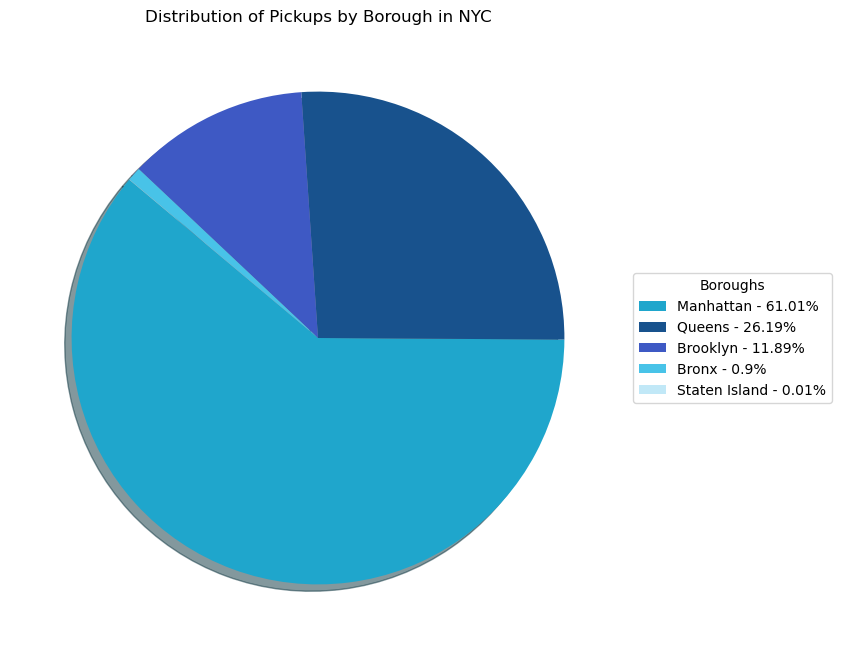

In [ ]:
import matplotlib.pyplot as plt

# Mengatur ukuran figure
plt.figure(figsize=(8, 8))
wedges, _ = plt.pie(
    busiest_borough['count'], 
    colors=["#1fa6cc","#18528d","#3e59c4","#48c3e8","#c1e8f7"], 
    shadow=True, 
    startangle=140
)

labels = busiest_borough['Borough'] + ' - ' + (busiest_borough['count'] / busiest_borough['count'].sum() * 100).round(2).astype(str) + '%'
plt.legend(wedges, labels, title="Boroughs", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.title('Distribution of Pickups by Borough in NYC')
plt.show()


## Analisis Jam Sibuk pada setiap Borough

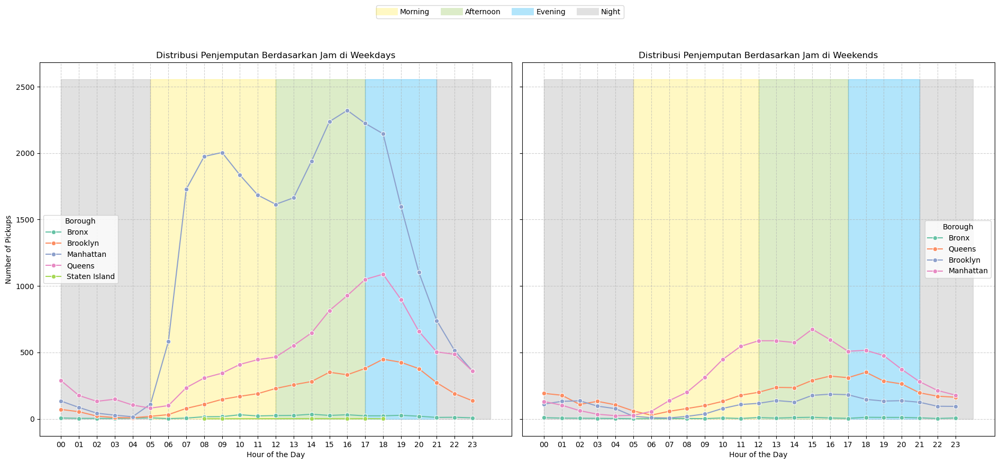

In [ ]:
from matplotlib.lines import Line2D

# Mengelompokkan data berdasarkan Borough, pickup_hour, dan day_type
borough_hourly_daytype = df.groupby(['PU_Borough', 'pickup_hour', 'day_type'])['lpep_pickup_datetime'].count().reset_index()
borough_hourly_daytype = borough_hourly_daytype.rename(columns={'lpep_pickup_datetime': 'pickup_count', 'PU_Borough': 'Borough'})

# Membuat plot untuk Weekday dan Weekend
fig, axes = plt.subplots(1, 2, figsize=(19, 8), sharey=True)

# Plot untuk Weekday
weekday_data = borough_hourly_daytype[borough_hourly_daytype['day_type'] == 'Weekday']
sns.lineplot(data=weekday_data, x='pickup_hour', y='pickup_count', hue='Borough', marker='o', palette='Set2', ax=axes[0])
axes[0].fill_between(x=[5, 12], y1=0, y2=weekday_data['pickup_count'].max() * 1.1, color='#FFEB3B', alpha=0.3, label='Morning')
axes[0].fill_between(x=[12, 17], y1=0, y2=weekday_data['pickup_count'].max() * 1.1, color='#8BC34A', alpha=0.3, label='Afternoon')
axes[0].fill_between(x=[17, 21], y1=0, y2=weekday_data['pickup_count'].max() * 1.1, color='#03A9F4', alpha=0.3, label='Evening')
axes[0].fill_between(x=[21, 24], y1=0, y2=weekday_data['pickup_count'].max() * 1.1, color='#9E9E9E', alpha=0.3, label='Night')
axes[0].fill_between(x=[0, 5], y1=0, y2=weekday_data['pickup_count'].max() * 1.1, color='#9E9E9E', alpha=0.3)  
axes[0].set_title('Distribusi Penjemputan Berdasarkan Jam di Weekdays')
axes[0].set_xlabel('Hour of the Day')
axes[0].set_ylabel('Number of Pickups')
axes[0].set_xticks(range(0, 24))
axes[0].grid(True, linestyle='--', alpha=0.6)

# Plot untuk Weekend
weekend_data = borough_hourly_daytype[borough_hourly_daytype['day_type'] == 'Weekend'].sort_values(by='pickup_hour')
sns.lineplot(data=weekend_data, x='pickup_hour', y='pickup_count', hue='Borough', marker='o', palette='Set2', ax=axes[1])
axes[1].fill_between(x=[5, 12], y1=0, y2=weekday_data['pickup_count'].max() * 1.1, color='#FFEB3B', alpha=0.3, label='Morning')
axes[1].fill_between(x=[12, 17], y1=0, y2=weekday_data['pickup_count'].max() * 1.1, color='#8BC34A', alpha=0.3, label='Afternoon')
axes[1].fill_between(x=[17, 21], y1=0, y2=weekday_data['pickup_count'].max() * 1.1, color='#03A9F4', alpha=0.3, label='Evening')
axes[1].fill_between(x=[21, 24], y1=0, y2=weekday_data['pickup_count'].max() * 1.1, color='#9E9E9E', alpha=0.3, label='Night')
axes[1].fill_between(x=[0, 5], y1=0, y2=weekday_data['pickup_count'].max() * 1.1, color='#9E9E9E', alpha=0.3)  
axes[1].set_title('Distribusi Penjemputan Berdasarkan Jam di Weekends')
axes[1].set_xlabel('Hour of the Day')
axes[1].set_xticks(range(0, 24))
axes[1].grid(True, linestyle='--', alpha=0.6)

time_labels = [
    Line2D([0], [0], color='#FFEB3B', lw=10, alpha=0.3, label='Morning'),
    Line2D([0], [0], color='#8BC34A', lw=10, alpha=0.3, label='Afternoon'),
    Line2D([0], [0], color='#03A9F4', lw=10, alpha=0.3, label='Evening'),
    Line2D([0], [0], color='#9E9E9E', lw=10, alpha=0.3, label='Night')
]

# Menyusun legend secara gabungan
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles= time_labels, loc='upper center', ncol=4, bbox_to_anchor=(0.5, 1.1))

plt.tight_layout()
plt.show()

In [ ]:
# Menghitung zone tersibuk berdasarkan pickup
busiest_zone = df['PU_Zone'].value_counts().reset_index().rename(columns={'index': 'Zone', 'PU_Zone': 'Zone', 'count': 'Count'})

# kolom borough
busiest_zone = busiest_zone.merge(borough_zone, left_on='Zone', right_on='Zone', how='inner')
busiest_zone = busiest_zone.drop(columns=['LocationID', 'service_zone'])

busiest_zone.head(15)

,Zone,Count,Borough
0,East Harlem North,12586,Manhattan
1,East Harlem South,8610,Manhattan
2,Forest Hills,3630,Queens
3,Central Harlem,3610,Manhattan
4,Morningside Heights,3544,Manhattan
5,Central Park,2813,Manhattan
6,Elmhurst,2753,Queens
7,Fort Greene,2062,Brooklyn
8,Astoria,1618,Queens
9,Washington Heights South,1580,Manhattan


## Analisa Sebaran Lokasi Penjemputan dan Rata-Rata Pendapatan per Lokasi Penjemputan

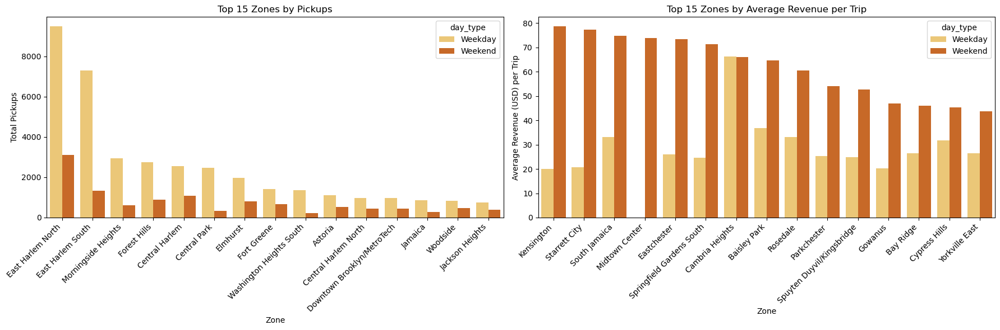

In [ ]:
# Hitung pickup count dan average revenue per zone dan day_type
pickup_count = df.groupby(['PU_Zone', 'day_type'])['lpep_pickup_datetime'].count().reset_index(name='Pickups')
avg_revenue = df.groupby(['PU_Zone', 'day_type'])['total_amount'].mean().reset_index(name='Avg_Revenue')

# Gabungkan keduanya
zone_stats = pd.merge(pickup_count, avg_revenue, on=['PU_Zone', 'day_type'])

# Ambil 15 zona tersibuk untuk weekday
top15_pickups_weekday = (
    zone_stats[zone_stats['day_type'] == 'Weekday']
    .nlargest(15, 'Pickups')
    ['PU_Zone']
)

# Ambil 15 zona tertinggi revenue untuk weekend
top15_revenue_weekend = (
    zone_stats[zone_stats['day_type'] == 'Weekend']
    .nlargest(15, 'Avg_Revenue')
    ['PU_Zone']
)

# Filter data untuk plotting:
pickup_data = zone_stats[zone_stats['PU_Zone'].isin(top15_pickups_weekday)]
revenue_data = zone_stats[zone_stats['PU_Zone'].isin(top15_revenue_weekend)]

# Urutkan sesuai urutan pickup tertinggi
pickup_order = pickup_data[pickup_data['day_type'] == 'Weekday'].sort_values('Pickups', ascending=False)['PU_Zone']
revenue_order = revenue_data[revenue_data['day_type'] == 'Weekend'].sort_values('Avg_Revenue', ascending=False)['PU_Zone']

# Plotting
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=False)

# Barplot untuk total pickups
sns.barplot(
    data=pickup_data,
    x='PU_Zone',
    y='Pickups',
    hue='day_type',
    ax=axes[0],
    order=pickup_order,
    palette='YlOrBr'
)
axes[0].set_title('Top 15 Zones by Pickups')
axes[0].set_xlabel('Zone')
axes[0].set_ylabel('Total Pickups')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

# Barplot untuk average revenue
sns.barplot(
    data=revenue_data,
    x='PU_Zone',
    y='Avg_Revenue',
    hue='day_type',
    ax=axes[1],
    order=revenue_order,
    palette='YlOrBr'
)
axes[1].set_title('Top 15 Zones by Average Revenue per Trip')
axes[1].set_xlabel('Zone')
axes[1].set_ylabel('Average Revenue (USD) per Trip')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()


## Analisa Sebaran Lokasi Penjemputan Setiap Zona pada Weekend dan Weekdays

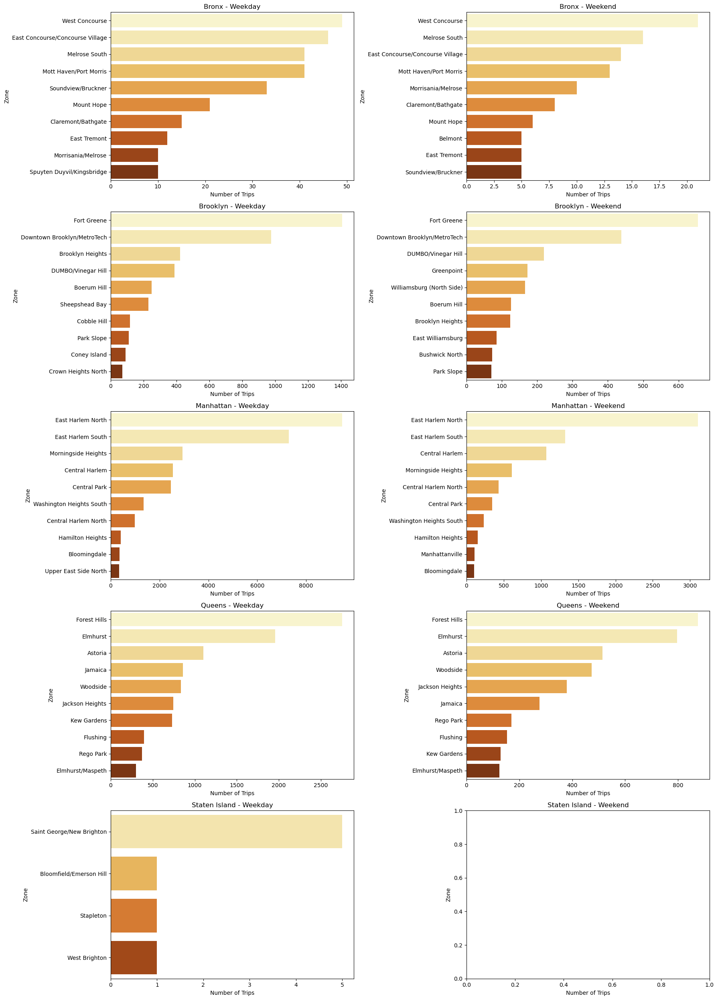

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# 1. Grouping dan sorting data
trip_counts = (
    df.groupby(['PU_Borough', 'PU_Zone', 'day_type'])['lpep_pickup_datetime']
    .count()
    .reset_index()
    .rename(columns={'lpep_pickup_datetime': 'Number of Trips',
                     'PU_Borough': 'Borough', 'PU_Zone': 'Zone'})
    .sort_values(by=['Borough', 'day_type', 'Number of Trips'], ascending=[True, True, False])
)

# 2. Daftar borough unik
boroughs = trip_counts['Borough'].unique()
n_boroughs = len(boroughs)

# 3. Setup figure: 1 row per borough, 2 kolom (Weekday vs Weekend)
fig, axes = plt.subplots(n_boroughs, 2, figsize=(18, 5 * n_boroughs), sharex=False)
if n_boroughs == 1:
    axes = np.array([axes])  # handle special case if only 1 borough

# 4. Plot per borough
for i, borough in enumerate(boroughs):
    # Top 10 Weekday
    weekday_data = trip_counts[
        (trip_counts['Borough'] == borough) & (trip_counts['day_type'] == 'Weekday')
    ].nlargest(10, 'Number of Trips')

    # Top 10 Weekend
    weekend_data = trip_counts[
        (trip_counts['Borough'] == borough) & (trip_counts['day_type'] == 'Weekend')
    ].nlargest(10, 'Number of Trips')

    # Weekday barplot
    sns.barplot(
        data=weekday_data,
        x='Number of Trips',
        y='Zone',
        palette='YlOrBr',
        ax=axes[i, 0]
    )
    axes[i, 0].set_title(f'{borough} - Weekday')
    axes[i, 0].set_xlabel('Number of Trips')
    axes[i, 0].set_ylabel('Zone')

    # Weekend barplot
    sns.barplot(
        data=weekend_data,
        x='Number of Trips',
        y='Zone',
        palette='YlOrBr',
        ax=axes[i, 1]
    )
    axes[i, 1].set_title(f'{borough} - Weekend')
    axes[i, 1].set_xlabel('Number of Trips')
    axes[i, 1].set_ylabel('Zone')

# 5. Final layout
plt.tight_layout()
plt.show()


## Visualisasi Sebaran Data Menggunakan Map Folium

[Reference: NYC Taxi Zone Info](https://www.kaggle.com/datasets/mxruedag/tlc-nyc-taxi-zones)



In [ ]:
import folium
import geopandas as gpd
import pandas as pd

# load nyc taxi geojson
nyc_geojson = gpd.read_file('05. NYC_Taxi_Zones.geojson')

nyc_geojson['borough'].value_counts().reset_index()

,borough,count
0,Queens,69
1,Manhattan,69
2,Brooklyn,61
3,Bronx,43
4,Staten Island,20
5,EWR,1


## Visualisasi Jumlah Penjemputan di setiap Borough

In [ ]:
import pandas as pd
import geopandas as gpd
import folium

# --- 1. Load dan filter GeoJSON ---
gdf = gpd.read_file('05. NYC_Taxi_Zones.geojson')
gdf = gdf[gdf['borough'] != 'EWR']  # Drop EWR

# --- 2. Hitung total pickup per borough ---
pickup_summary = (
    df.groupby('PU_Borough')['lpep_pickup_datetime']
    .count()
    .reset_index(name='Total_Pickup')
    .rename(columns={'PU_Borough': 'borough'})
)

# --- 3. Merge GeoDataFrame dengan pickup data ---
gdf = gdf.merge(pickup_summary, on='borough', how='left')

# --- 4. Buat peta choropleth ---
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

choropleth = folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['borough', 'Total_Pickup'],
    key_on='feature.properties.borough',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Total Pickups per Borough',
    bins=[0, 5000, 10000, 20000, 30000, 40000],
    reset=True
).add_to(nyc_map)

# --- 5. Tooltip interaktif per borough ---
folium.GeoJson(
    gdf,
    name='GeoJSON Layer',
    tooltip=folium.GeoJsonTooltip(
        fields=['borough', 'Total_Pickup'],
        aliases=['Borough:', 'Total Pickups:'],
        localize=True
    ),
    style_function=lambda x: {'color': 'black', 'weight': 0.5}
).add_to(choropleth)

# --- 6. Landmark penting sebagai marker ---
landmarks = {
    "Statue of Liberty": [40.6892, -74.0445],
    "Empire State Building": [40.748817, -73.985428],
    "Central Park": [40.785091, -73.968285],
    "Columbia University": [40.8075, -73.9626],
    "Marcus Garvey Park": [40.8055, -73.9448],
    "NYC Health + Hospitals/Elmhurst": [40.7423, -73.8782],
    "Forest Hills Stadium": [40.7181, -73.8448],
    "Brooklyn Bridge": [40.706086, -73.996864],
    "Barclays Center": [40.6827, -73.9754],
    "Times Square": [40.7580, -73.9855],
    "Grand Central Terminal": [40.7527, -73.9772],
    "Penn Station": [40.7506, -73.9935],
    "Union Square": [40.7359, -73.9911],
    "Chinatown": [40.7158, -73.9970],
    "Battery Park": [40.7033, -74.0170],
    "Flushing Meadows Corona Park": [40.7498, -73.8407],
    "LaGuardia Airport": [40.7769, -73.8740],
    "JFK Airport": [40.6413, -73.7781],
    "Wall Street": [40.7074, -74.0113],
    "Yankee Stadium": [40.8296, -73.9262],
    "Bronx Zoo": [40.8506, -73.8762],
    "New York Botanical Garden": [40.8623, -73.8800],
    "Fordham University": [40.8616, -73.8853],
    "Little Italy (Arthur Avenue)": [40.8553, -73.8871],
    "Citi Field": [40.7571, -73.8458],
    "Queens Museum": [40.7450, -73.8465],
    "Gantry Plaza State Park": [40.7464, -73.9560],
    "The Unisphere": [40.7459, -73.8448],
    "Prospect Park": [40.6602, -73.9690],
    "Brooklyn Botanic Garden": [40.6694, -73.9624],
    "Coney Island Boardwalk": [40.5743, -73.9876],
    "DUMBO": [40.7033, -73.9882],
    "Staten Island Ferry Terminal": [40.6437, -74.0737],
    "Snug Harbor Cultural Center & Botanical Garden": [40.6431, -74.1010],
    "Historic Richmond Town": [40.5707, -74.1453],
    "Staten Island Zoo": [40.6257, -74.1163]
}

# Tambahkan markers
for name, coords in landmarks.items():
    folium.Marker(
        location=coords,
        tooltip=name,
        icon=folium.Icon(color='red', icon='star')
    ).add_to(nyc_map)

# --- 7. Tampilkan layer control ---
folium.LayerControl().add_to(nyc_map)

# --- 8. Tampilkan peta ---
nyc_map


## Visualisasi Jumlah Penjemputan di setiap Lokasi Penjemputan (Zone)

In [ ]:
import pandas as pd
import geopandas as gpd
import folium

# 1. Filter GeoJSON (hapus EWR)
gdf = gpd.read_file('05. NYC_Taxi_Zones.geojson')
gdf = gdf[gdf['borough'] != 'EWR']

# 2. Hitung total pickup per zone
pickup_by_zone = (
    df.groupby('PU_Zone')['lpep_pickup_datetime']
    .count()
    .reset_index(name='Total_Pickup')
    .rename(columns={'PU_Zone': 'zone'})
)

# 3. Bersihkan dan gabungkan data GeoJSON
gdf = gdf.drop(columns=['Total_Pickup', 'Zone'], errors='ignore')
gdf = gdf.merge(pickup_by_zone, on='zone', how='left')
gdf['Total_Pickup'].fillna(0, inplace=True)

# 4. Buat peta dasar
m = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

# 5. Tambahkan choropleth layer
folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['zone', 'Total_Pickup'],
    key_on='feature.properties.zone',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Total Pickups per Zone',
    bins=[0, 1000, 5000, 10000, 15000, 20000, 25000],
    reset=True
).add_to(m)

# 6. Tooltip interaktif
tooltip = folium.GeoJsonTooltip(
    fields=['zone', 'Total_Pickup'],
    aliases=['Zone:', 'Total Pickups:'],
    localize=True
)

folium.GeoJson(
    gdf,
    name='geojson',
    tooltip=tooltip,
    style_function=lambda x: {'color': 'black', 'weight': 0.5}
).add_to(m)

# 7. Landmark markers
landmarks = {
    'Statue of Liberty': [40.6892, -74.0445],
    'Empire State Building': [40.748817, -73.985428],
    'Central Park': [40.785091, -73.968285],
    'Columbia University': [40.8075, -73.9626],
    'Marcus Garvey Park': [40.8055, -73.9448],
    'NYC Health + Hospitals/Elmhurst': [40.7423, -73.8782],
    'Forest Hills Stadium': [40.7181, -73.8448],
    'Brooklyn Bridge': [40.706086, -73.996864],
    'Barclays Center': [40.6827, -73.9754],
    'Times Square': [40.7580, -73.9855],
    'Grand Central Terminal': [40.7527, -73.9772],
    'Penn Station': [40.7506, -73.9935],
    'Union Square': [40.7359, -73.9911],
    'Chinatown': [40.7158, -73.9970],
    'Battery Park': [40.7033, -74.0170],
    'Flushing Meadows Corona Park': [40.7498, -73.8407],
    'LaGuardia Airport': [40.7769, -73.8740],
    'JFK Airport': [40.6413, -73.7781],
    'Wall Street': [40.7074, -74.0113],
    'Yankee Stadium': [40.8296, -73.9262],
    'Bronx Zoo': [40.8506, -73.8762],
    'New York Botanical Garden': [40.8623, -73.8800],
    'Fordham University': [40.8616, -73.8853],
    'Little Italy (Arthur Avenue)': [40.8553, -73.8871],
    'Citi Field': [40.7571, -73.8458],
    'Queens Museum': [40.7450, -73.8465],
    'Gantry Plaza State Park': [40.7464, -73.9560],
    'The Unisphere': [40.7459, -73.8448],
    'Prospect Park': [40.6602, -73.9690],
    'Brooklyn Botanic Garden': [40.6694, -73.9624],
    'Coney Island Boardwalk': [40.5743, -73.9876],
    'DUMBO': [40.7033, -73.9882],
    'Staten Island Ferry Terminal': [40.6437, -74.0737],
    'Snug Harbor Cultural Center & Botanical Garden': [40.6431, -74.1010],
    'Historic Richmond Town': [40.5707, -74.1453],
    'Staten Island Zoo': [40.6257, -74.1163]
}

# Tambahkan markers dengan icon yang lebih menarik
for name, coords in landmarks.items():
    folium.Marker(
        location=coords,
        tooltip=name,
        icon=folium.Icon(color='red', icon='star', prefix='glyphicon')
    ).add_to(m)

# 8. Layer control
folium.LayerControl().add_to(m)

# 9. Tampilkan peta
m
